# **1.0 Importing Libraries and Packages** 

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt



!pip install mne
import mne
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs, corrmap)

!pip install autoreject
from autoreject import get_rejection_threshold
from autoreject import AutoReject


from google.colab import drive
drive.mount('/content/drive')

os.chdir("/content/drive/MyDrive/EEG-IGT Experiment Data")
os.getcwd()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached matplotlib-3.5.3-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.whl (11.2 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.1.3
    Uninstalling matplotlib-3.1.3:
      Successfully uninstalled matplotlib-3.1.3


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


'/content/drive/MyDrive/EEG-IGT Experiment Data'

In [ ]:
!pip uninstall matplotlib
!pip install matplotlib==3.1.3

# **2.0 Functions** 

## **2.1 IGT Function** 

## **2.2 Trigger Events Function** 

In [ ]:
def EVENTS(a):
    a = a.TL02.str.split(r'\t', expand=True) # dividing by columns; !!!the whole dataset is more than 200 trials (201)!!!
    a.columns = ['Time', 'Time1', 'Mark'] # rename columns
    a.drop('Time1', axis = 1, inplace = True) # drop colunm "0"

    # Sort decision time points (DTP) only and dividing by 10 Blocks
    igt1 = a[(a.Mark == '"PP 1"') | (a.Mark == '"PP 2"') | (a.Mark == '"PP 3"') | (a.Mark == '"PP 4"')]
    igt1.columns = ['DTP', 'Deck']
    igt1 = igt1.reset_index(drop = True)
    igt1['Block'] = pd.DataFrame(np.repeat(np.arange(0, 10), 20))
    
    # Sort reaction time points (RTP)
    # PP9 - win
    # PP10 - loss
    igt2 = a[(a.Mark == '"PP 9"') | (a.Mark == '"PP 10"')]
    igt2.columns = ['RTP', 'Result']
    igt2 = igt2.reset_index(drop = True)

    # The whole IGT dataset
    igt = igt1.join(igt2)
    igt = igt.dropna(axis=0, how='any') # erasing NaN rows
    igt = igt.drop_duplicates(keep='first', subset='RTP') # duplicates in rows deliting

    # Rename decks and results
    igt['RTP'] = igt['RTP'].astype(str).astype(int)
    igt['DTP'] = igt['DTP'].astype(str).astype(int)
    igt.loc[(igt.Deck == '"PP 1"'), 'Deck'] = 'A'
    igt.loc[(igt.Deck == '"PP 2"'), 'Deck'] = 'B'
    igt.loc[(igt.Deck == '"PP 3"'), 'Deck'] = 'C' 
    igt.loc[(igt.Deck == '"PP 4"'), 'Deck'] = 'D'
    igt.loc[(igt.Result == '"PP 9"'), 'Result'] = '1' 
    igt.loc[(igt.Result == '"PP 10"'), 'Result'] = '0'
    
    # Events (triggers) list creation
    igt['Tmax'] = igt['RTP'] + 800 # RTP is 0 point of trigger event, Tmax is the END point of the trigger event
    igt['Tmin'] = igt['RTP'] - 200 # RTP is 0 point of trigger event, Tmin is the START point of the trigger event
    events = igt[['Deck', 'Tmin', 'Tmax']]
    events = events.melt(id_vars=['Deck'], value_vars=['Tmin', 'Tmax'])
    events.drop('Deck', axis = 1, inplace = True)
    events.columns = ['point', 'time']
    events = events.sort_values(by=['time'])
    
    Tmin = events[(events.point == 'Tmin')]
    Tmax = events[(events.point == 'Tmax')]
    Tmax = Tmax.reset_index(drop = True)
    Tmin['index'] = pd.DataFrame(np.arange(1001, 2001))
    Tmax['index'] = pd.DataFrame(np.arange(2001, 3001))
    events = pd.concat([Tmin, Tmax])
    events = events.reset_index(drop = True)
    events = events.sort_values(by=['time'])   
    # For following synchronization with EEG dataset EVENTS data should be adjusted by adding an appropriate columns
    
    # Set of triggers events (time window intervals) creation: 200 card selections by 1001 time points, total 200200 rows     
    intervals = pd.concat([pd.DataFrame([i], columns=['point']) for i in range(1001)]*200, ignore_index=True)
    intervals.loc[intervals.point == 0, 'point'] = '01Tmin'
    intervals.loc[intervals.point == 1000, 'point'] = '02Tmax'
    intervals['int'] = pd.DataFrame(np.arange(0, 200200)) 
    
    # Rename Tmin and Tmax points for following sorting
    intervals['point'] = intervals['point'].astype(str)
    
    # now we have the first 200 rows of Tmin (01Tmin) and the second 200 rows of Tmax (02Tmax) 
    # for following numbering simplification
    intervals = intervals.sort_values(by=['point', 'int'])
    intervals = intervals.reset_index(drop = True)
    
    # Adding new column "index" for numbering Tmin and Tmax
    A = [np.arange(1001, 1201)]
    B = [np.arange(2001, 2201)]
    AA = pd.DataFrame(A).T
    BB = pd.DataFrame(B).T
    C = pd.concat([AA, BB])
    C = C.reset_index(drop = True)
    intervals = intervals.join(C)
    intervals.columns = ['point', 'int', 'index']
    intervals = intervals.fillna(0)
    # Now we have individual indexes for each Tmin and Tmax
    
    # Sort back to 1 - 200200 by "int" column
    intervals = intervals.sort_values(by=['int'])
    intervals['index'] = intervals['index'].astype(int)
    
    # Rename points back
    intervals.loc[(intervals.point == '01Tmin'), 'point'] = 'Tmin' 
    intervals.loc[(intervals.point == '02Tmax'), 'point'] = 'Tmax'
    
     # Creation trigger events dataset
    
    events_triggers = intervals.merge(events, how = 'left', on = 'index') # merge EVENTS and INTERVALS
    
    events_triggers = events_triggers.reset_index(drop = True)
    events_triggers = events_triggers[['point_x', 'time']] # taking just two columns
    events_triggers.columns = ['intervals', 'time'] # renaming columns to "INTARVALS" and "TIME"

    events_triggers['time3'] = events_triggers['time']
    events_triggers['time3'].fillna(method='bfill', inplace=True) # filling NaN as the lower  number

    events_triggers = events_triggers.dropna(subset=['time3'])# drop NaN by the column

    events_triggers['time4'] = events_triggers['time']

    events_triggers = events_triggers.fillna(method='ffill') # filling NaN as the upper number

    events_triggers['intervals2'] = events_triggers['intervals']
    events_triggers.loc[(events_triggers.intervals2 == 'Tmin'), 'intervals2'] = '0' 
    events_triggers.loc[(events_triggers.intervals2 == 'Tmax'), 'intervals2'] = '0' 
    events_triggers['intervals2'] = events_triggers['intervals2'].astype(int)

    events_triggers['time5'] = events_triggers['time4'] + events_triggers['intervals2']
    events_triggers = events_triggers[['intervals', 'time5']]
    events_triggers.columns = ['intervals', 'time']
 
    return events_triggers

## **2.3 EEG Filtering Function** 

In [ ]:
def FILTER(file_eeg):
  file_eeg.load_data()
  file_eeg_filt = file_eeg.filter(l_freq=1., h_freq=None)

  return file_eeg_filt

In [ ]:
def FILTER_40(file_eeg):
    file_eeg.load_data()

    # Filtering: low-pass 0.1Hz, High-pass 40Hz
    file_eeg_filt_notch = file_eeg.copy().notch_filter(50, verbose='warning')  # notch filter 50 Hz
    file_eeg_filt = file_eeg_filt_notch.filter(l_freq=0.1, h_freq=40, fir_design='firwin', skip_by_annotation='edge', verbose='warning') # FIR filter

    return file_eeg_filt

In [ ]:
def FILTER_100(file_eeg):
    file_eeg.load_data()

    # Filtering: low-pass 0.1Hz, High-pass 100Hz
    file_eeg_filt_notch = file_eeg.copy().notch_filter(50, verbose='warning')  # notch filter 50 Hz
    file_eeg_filt = file_eeg_filt_notch.filter(l_freq=0.1, h_freq=100, fir_design='firwin', skip_by_annotation='edge', verbose="warning") # FIR filter

    return file_eeg_filt

In [ ]:
def FILTER_50(file_eeg):
    file_eeg.load_data()

    # Filtering: low-pass 0.1Hz, High-pass 50Hz
    file_eeg_filt = file_eeg.notch_filter(50, verbose='warning')  # notch filter 50 Hz
    file_eeg_filt = file_eeg.filter(l_freq=0.1, h_freq=50, fir_design='firwin', skip_by_annotation='edge', verbose='warning') # FIR filter

    return file_eeg_filt

In [ ]:
def FILTER_NONE(file_eeg):
    file_eeg.load_data()

    # Filtering: low-pass 0.1Hz, High-pass None
    file_eeg_filt = file_eeg.notch_filter(50, verbose='warning')  # notch filter 50 Hz
    file_eeg_filt = file_eeg.filter(l_freq=0.1, h_freq=None, fir_design='firwin', skip_by_annotation='edge', verbose='warning') # FIR filter

    return file_eeg_filt

In [ ]:
def FILTER_30(file_eeg):
    file_eeg.load_data()

    # Filtering: low-pass 1Hz, High-pass 40Hz
    file_eeg_filt = file_eeg.notch_filter(50)  # notch filter 50 Hz
    file_eeg_filt = file_eeg.filter(l_freq=0.1, h_freq=30, fir_design='firwin', skip_by_annotation='edge') # FIR filter

    return file_eeg_filt

In [ ]:
def FILTER_ICA(file_eeg):
    file_eeg.load_data()

    # Filtering: low-pass 1Hz, High-pass 30Hz
    file_eeg_filt_ica = file_eeg.copy().filter(l_freq=1, h_freq=40, fir_design='firwin', skip_by_annotation='edge', verbose='warning') # FIR filter

    return file_eeg_filt_ica

## **2.4 EEG ICA Function** 

In [ ]:
def REJECT(file_eeg_filt_ica):
  tstep = 1.0         # Break raw data into 1 s epochs
  events_ica = mne.make_fixed_length_events(file_eeg_filt_ica, duration=tstep)
  epochs_ica = mne.Epochs(file_eeg_filt_ica, events_ica,
                        tmin=0.0, tmax=tstep,
                        baseline=None,
                        preload=True)

  return epochs_ica

In [ ]:
def ICA_REJECT(epochs_ica):
  ica = ICA(n_components=20, max_iter='auto', random_state=97, method='fastica')
  ica.fit(epochs_ica, reject=get_rejection_threshold(epochs_ica), tstep=1.0)

  return ica

In [ ]:
def ICA_REJECT_THRESHOLD(epochs_ica):
  reject_criteria = dict(eeg=0.005)
  ica = ICA(n_components=0.99, max_iter='auto', random_state=97, method='fastica')
  ica.fit(epochs_ica, reject=reject_criteria, tstep=1.0)

  return ica

In [ ]:
def ICA_(file_eeg_filt):
  ica = ICA(n_components=20, max_iter='auto', random_state=97, method='fastica')
  ica.fit(file_eeg_filt)

  return ica

In [ ]:
def ICA_REJECT_99(epochs_ica):
  reject_thr = get_rejection_threshold(epochs_ica)
  print('rejection threshold: ', reject_thr)
  ica = ICA(n_components=0.99, max_iter='auto', random_state=97, method='fastica')
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)

  return ica

In [ ]:
def ICA_REJECT_AUTO_99(epochs_ica):
  ar = AutoReject()
  epochs_clean = ar.fit_transform(epochs_ica)
  ica = ICA(n_components=0.99, max_iter='auto', random_state=97, method='fastica')
  ica.fit(epochs_clean, tstep=1.0)

  return ica

## **2.5 IGT and EEG Synchronization Function** 

In [ ]:
 def EEG(eeg_data, igt_trigger):    
    # The whole dataset creation connecting trigger events with eeg levels by time points
    S = eeg_data.join(igt_trigger.set_index('time'), on='time')
    S = S.dropna(axis=0, how='any') # erasing NaN rows
    S = S.reset_index(drop = True)
    
    # preparing dataset for following PIVOT function application
    # adding 'EPOCHS' column that reflects 200 epochs (each for each card choice) with 1001 time points
    S['epochs'] = pd.DataFrame(np.repeat(np.arange(0, 200), 1001))
    S.loc[(S.intervals == 'Tmin'), 'intervals'] = '0' 
    S.loc[(S.intervals == 'Tmax'), 'intervals'] = '1000' 
    S['intervals'] = S['intervals'].astype(int)

    # Dataset transformation, matching (Tmin, -199, -198, ..., -1, RTP(0), 1, 2,3, ....., 788, 789, Tmax) points
    S = S.pivot(index='epochs', columns='intervals', values='level')
    S = S.reset_index(drop = True)
    S_T = S.T
    S_T = S_T.reset_index(drop = True)
    S_T_T = S_T.T
    S_T_T = S_T_T.reset_index(drop = True)
    S_T_T_T = S_T_T.T
    
    return S_T_T_T

In [ ]:
# Combining 20 EEG datasets in one. Averaging
def TOTAL(a):
    a_mean = a.mean(axis=1)
    
    
    return a_mean

In [ ]:
def FRAME(ica):
  file_eeg_filt_mod = ica.to_data_frame()
  file_eeg_filt_mod.drop('time', axis = 1, inplace = True)
  
  # Signal averaging by channels
  file_eeg_filt_mod['level'] = file_eeg_filt_mod.mean(axis=1)
  file_eeg_filt_mod_mean = file_eeg_filt_mod['level']
  file_eeg_filt_mod_mean = file_eeg_filt_mod_mean.to_frame()
  file_eeg_filt_mod_mean['time'] = file_eeg_filt_mod_mean.index
  
  return file_eeg_filt_mod_mean

## **2.6 EEG Plot Function** 

In [ ]:
def EEG_PLOT(a):
  a_mean = a.to_frame()
  a_mean['Time'] = pd.DataFrame(np.arange(-200, 801))
  a_mean.columns = ['Level', 'Time']

  plt.figure(figsize=(20, 6))
  
  plt.plot(a_mean['Time'], a_mean['Level'])

  plt.hlines(0, -200, 800, colors='black', linestyles='dashed')
  plt.vlines(0, -3.3, 2.7, colors='black', linestyles='dashed')
  plt.grid()
  plt.xlabel('Time, [ms]', size='15')
  plt.ylabel('Level, [$\mu V$]', size='15')
  y = np.arange(-3.3, 3.3)
  plt.fill_betweenx(y,  80, 180, alpha=0.2)
  plt.fill_betweenx(y, 180, 280, alpha=0.2)
  plt.fill_betweenx(y, 280, 360, alpha=0.2)
  plt.fill_betweenx(y, 360, 480, alpha=0.2)
  plt.fill_betweenx(y, 480, 600, alpha=0.2)
  plt.yticks(fontsize=13)
  plt.xticks(np.arange(-200, 801, step=100), fontsize=13)

  plt.show()

  return

## **2.7 EEG Digitizing Function** 

In [ ]:
builtin_montages = mne.channels.get_builtin_montages(descriptions=True)
for montage_name, montage_description in builtin_montages:
    print(f'{montage_name}: {montage_description}')

easycap_montage = mne.channels.make_standard_montage('easycap-M1')
print(easycap_montage)

standard_1005: Electrodes are named and positioned according to the international 10-05 system (343+3 locations)
standard_1020: Electrodes are named and positioned according to the international 10-20 system (94+3 locations)
standard_alphabetic: Electrodes are named with LETTER-NUMBER combinations (A1, B2, F4, …) (65+3 locations)
standard_postfixed: Electrodes are named according to the international 10-20 system using postfixes for intermediate positions (100+3 locations)
standard_prefixed: Electrodes are named according to the international 10-20 system using prefixes for intermediate positions (74+3 locations)
standard_primed: Electrodes are named according to the international 10-20 system using prime marks (' and '') for intermediate positions (100+3 locations)
biosemi16: BioSemi cap with 16 electrodes (16+3 locations)
biosemi32: BioSemi cap with 32 electrodes (32+3 locations)
biosemi64: BioSemi cap with 64 electrodes (64+3 locations)
biosemi128: BioSemi cap with 128 electrodes (1

In [ ]:
def DIGITIZING(file_eeg):
  file_eeg.set_channel_types({'Fp1': 'eeg'})
  file_eeg.set_channel_types({'IO': 'eog'})
  file_eeg.set_montage(easycap_montage)

  return file_eeg

In [ ]:
def DIGITIZING_IO(file_eeg):
  file_eeg.set_channel_types({'Fp1': 'eeg'})
  file_eeg.set_montage(easycap_montage)

  return file_eeg

In [ ]:
def DROP_CHANNELS(file_eeg):
  file_eeg.drop_channels(['FT9', 'FT7', 'T7', 'TP7', 'TP9', 'FC5', 'CP5', 'FT10', 'FT8', 'T8', 'TP8', 'TP10', 'FC6', 'CP6'])

  return file_eeg


In [ ]:
def DROP_CHANNELS_IO(file_eeg):
  file_eeg.drop_channels(['IO', 'FT9', 'FT7', 'T7', 'TP7', 'TP9', 'FC5', 'CP5', 'FT10', 'FT8', 'T8', 'TP8', 'TP10', 'FC6', 'CP6'])

  return file_eeg

## **2.8 Artifacts Removing** 

In [ ]:
def ARTIFACTS_REMOVING(ica, file_eeg_filt):
  muscle_idx, muscle_scores = ica.find_bads_muscle(file_eeg_filt, h_freq=40, verbose='warning')               # 0.005 muscle artifacts
  eog_idx,       eog_scores = ica.find_bads_eog(file_eeg_filt, ch_name=['IO'], h_freq=30, verbose='warning')  # eog artifacts
  ecg_idx                   = [0, 1, 2]                                         # ecg artifacts
                                                
  file_eeg_filt_clean = ica.apply(file_eeg_filt, exclude = eog_idx + ecg_idx + muscle_idx)

  return file_eeg_filt_clean

In [ ]:
def ARTIFACTS_REMOVING_IO(ica, file_eeg_filt):
  muscle_idx, muscle_scores = ica.find_bads_muscle(file_eeg_filt, h_freq=40, verbose='warning')               # 0.005 muscle artifacts
  eog_idx,       eog_scores = ica.find_bads_eog(file_eeg_filt, ch_name=['Fp1', 'F8'], h_freq=30, verbose='warning')  # eog artifacts
  ecg_idx                   = [0, 1, 2]                                         # ecg artifacts
                                                
  file_eeg_filt_clean = ica.apply(file_eeg_filt, exclude = eog_idx + ecg_idx + muscle_idx)

  return file_eeg_filt_clean

# **3.0 Data Loading** 

In [ ]:
data_dir = './'
files_list = os.listdir(data_dir)
files_igt  = [i for i in files_list if i.split('.')[-1] == 'mrk']
files_eeg  = [i for i in files_list if i.split('.')[-1] == 'edf']

In [ ]:
files_eeg[18], files_igt[0]

('S01.edf', 'S01.edf.mrk')

In [ ]:
files_list

['S01.edf.mrk',
 'S03.edf.mrk',
 'S03.edf',
 'S04.edf.mrk',
 'S04.edf',
 'S05.edf.mrk',
 'S05.edf',
 'S06.edf.mrk',
 'S06.edf',
 'S07.edf.mrk',
 'S07.edf',
 'S08.edf',
 'S08.edf.mrk',
 'S09.edf',
 'S09.edf.mrk',
 'S10.edf',
 'S10.edf.mrk',
 'S11.edf.mrk',
 'S11.edf',
 'S12.edf',
 'S12.edf.mrk',
 'S13.edf.mrk',
 'S13.edf',
 'S14.edf.mrk',
 'S14.edf',
 'S15.edf',
 'S15.edf.mrk',
 'S16.edf',
 'S16.edf.mrk',
 'S17.edf',
 'S17.edf.mrk',
 'S18.edf',
 'S18.edf.mrk',
 'S19.edf',
 'S19.edf.mrk',
 'S20.edf.mrk',
 'S20.edf',
 'Index',
 'S02.edf.mrk',
 'S01.edf',
 'S02.edf']

# **1. Functions Application** 

In [ ]:
EVENTS
FILTER
FILTER_40
REJECT
ICA_REJECT
ICA
EEG
TOTAL
FRAME
EEG_PLOT
DIGITIZING
DROP_CHANNELS
ARTIFACTS_REMOVING

In [ ]:
def get_dataset(file_igt, file_eeg):
    igt = pd.read_csv(file_igt)             # reading IGT data
    
    events = EVENTS(igt)                    # trigger-events file creation

    eeg = mne.io.read_raw_edf(file_eeg)     # reading EEG data
    eeg = DIGITIZING(eeg)
    eeg = DROP_CHANNELS(eeg)
    print('')
    print('=== FILTER ===')
    file_eeg_filt = FILTER_100(eeg)          # EEG filtering
    print('')
    print('=== REJECT ===')  
    file_eeg_filt_ica = FILTER_ICA(eeg)       
    
    print('')
    print('=== ICA ===')
    file_eeg_filt_reject_ica = ICA_REJECT_THRESHOLD(file_eeg_filt_ica)
    print('')
    print('=== ARTIFACTS ===')
    file_eeg_filt_reject_ica_clean = ARTIFACTS_REMOVING(file_eeg_filt_reject_ica, file_eeg_filt)
    print('')
    print('=== PLOT ===')
    file_eeg_filt_reject_ica_clean_frame = FRAME(file_eeg_filt_reject_ica_clean)
    
    EEGdata = EEG(file_eeg_filt_reject_ica_clean_frame, events)  
    EEGdata_avg = TOTAL(EEGdata)
    EEGdata_avg_plot = EEG_PLOT(EEGdata_avg)
  
    return EEGdata_avg_plot

In [ ]:
def get_eeg_plot(data_dir):
    files_list = os.listdir(data_dir)
    files_igt =   [i for i in files_list if i.split('.')[-1] == 'mrk']
    files_eeg =   [i for i in files_list if i.split('.')[-1] == 'edf']

    for file_eeg in files_eeg:
        df = get_dataset(files_igt[files_igt.index(file_eeg+'.mrk')], file_eeg)
        print('Files Loaded: ', files_igt[files_igt.index(file_eeg+'.mrk')], file_eeg)
        print('============')
        print('')
        print('')
    
    return df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1855999  =      0.000 ...  1855.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 24 components
Fitting ICA took 105.2s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (24 components)
    Zeroing out 11 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


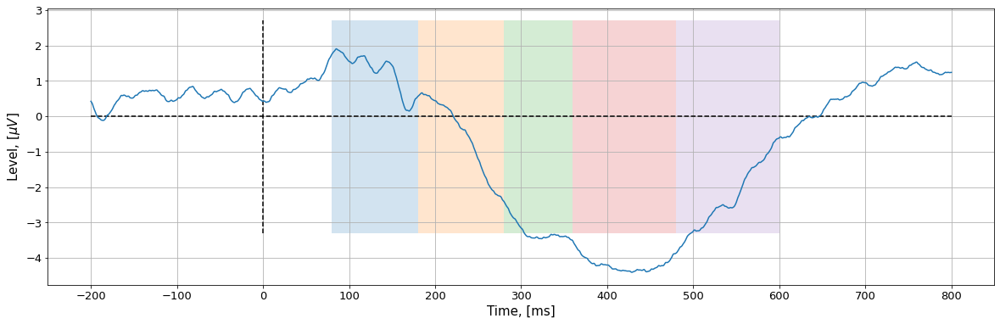

Files Loaded:  S03.edf.mrk S03.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1829999  =      0.000 ...  1829.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 26 components
Fitting ICA took 119.5s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (26 components)
    Zeroing out 5 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


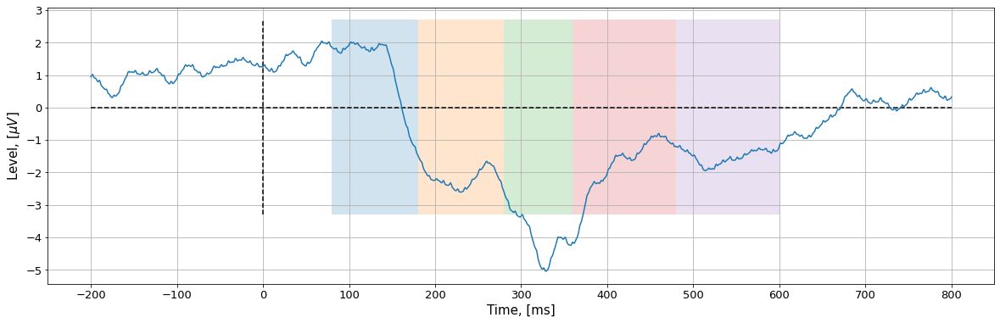

Files Loaded:  S04.edf.mrk S04.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1981999  =      0.000 ...  1981.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 19 components
Fitting ICA took 61.0s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (19 components)
    Zeroing out 3 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


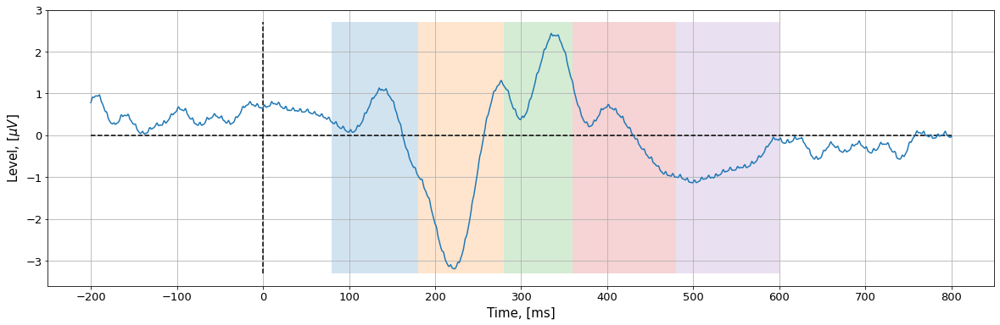

Files Loaded:  S05.edf.mrk S05.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S06.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2379999  =      0.000 ...  2379.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 20 components
Fitting ICA took 144.0s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 6 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


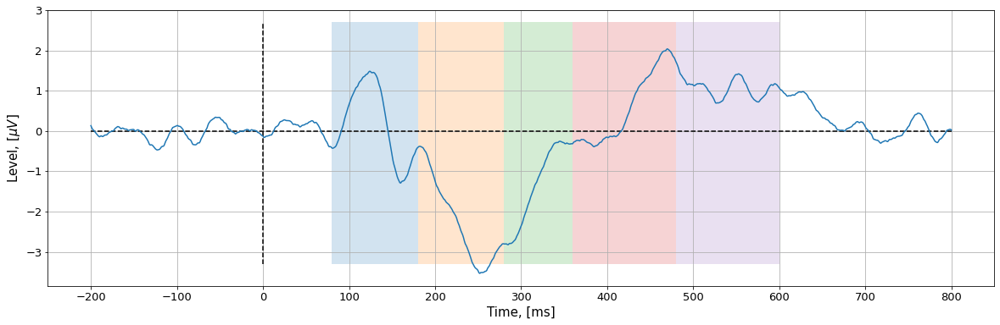

Files Loaded:  S06.edf.mrk S06.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1994999  =      0.000 ...  1994.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 21 components
Fitting ICA took 108.8s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (21 components)
    Zeroing out 3 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


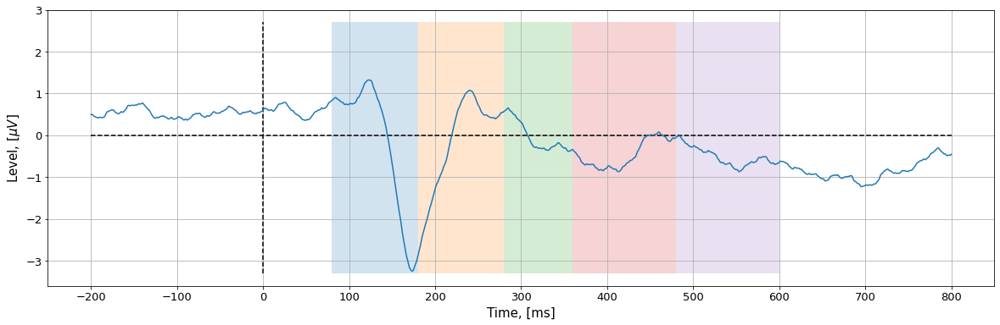

Files Loaded:  S07.edf.mrk S07.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2145999  =      0.000 ...  2145.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 27 components
Fitting ICA took 171.7s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 12 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


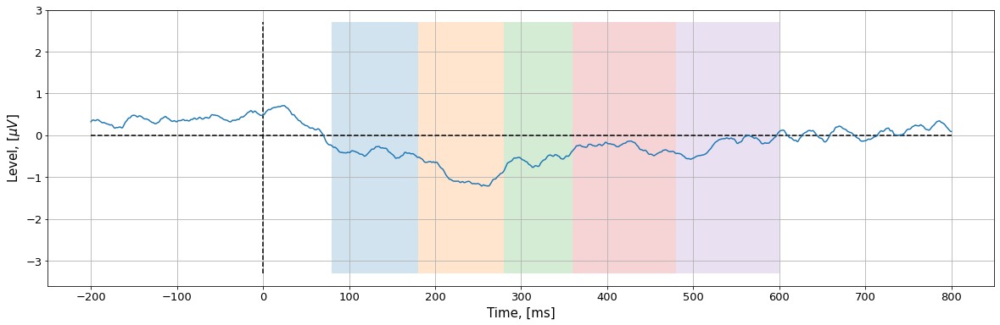

Files Loaded:  S08.edf.mrk S08.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1850999  =      0.000 ...  1850.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 11 components
Fitting ICA took 48.3s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (11 components)
    Zeroing out 3 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


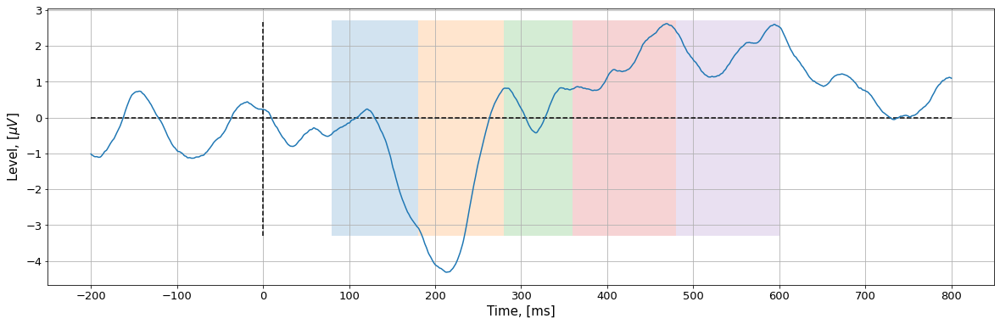

Files Loaded:  S09.edf.mrk S09.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S10.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1924999  =      0.000 ...  1924.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 25 components
Fitting ICA took 129.4s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (25 components)
    Zeroing out 5 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


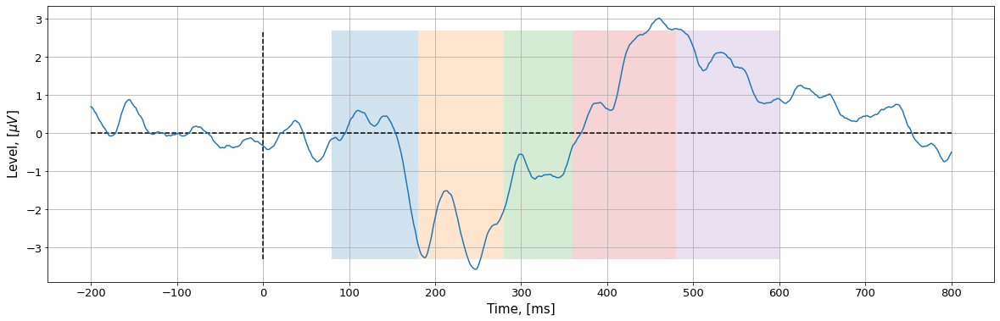

Files Loaded:  S10.edf.mrk S10.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



=== FILTER ===
Reading 0 ... 1715999  =      0.000 ...  1715.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 25 components
Fitting ICA took 96.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (25 components)
    Zeroing out 4 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


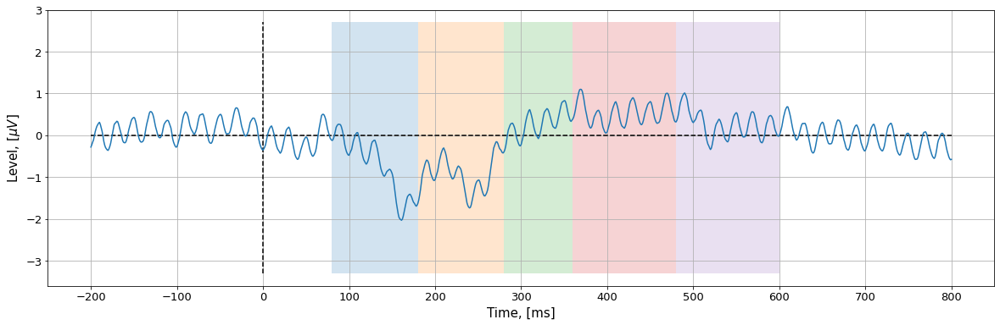

Files Loaded:  S11.edf.mrk S11.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2035999  =      0.000 ...  2035.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 21 components
Fitting ICA took 137.0s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (21 components)
    Zeroing out 3 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


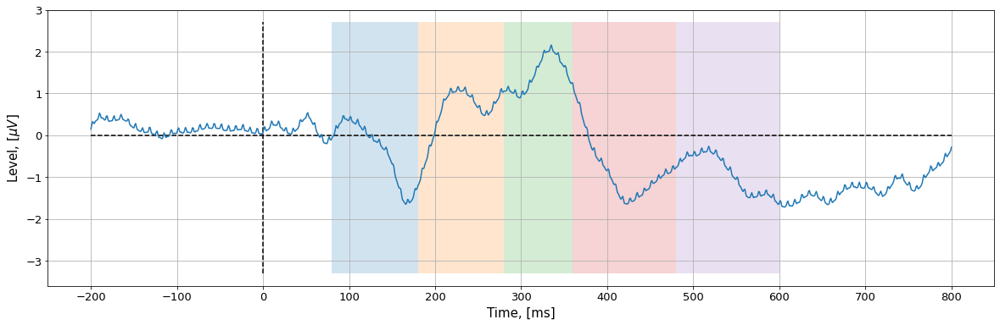

Files Loaded:  S12.edf.mrk S12.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1924999  =      0.000 ...  1924.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 28 components
Fitting ICA took 149.1s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (28 components)
    Zeroing out 7 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


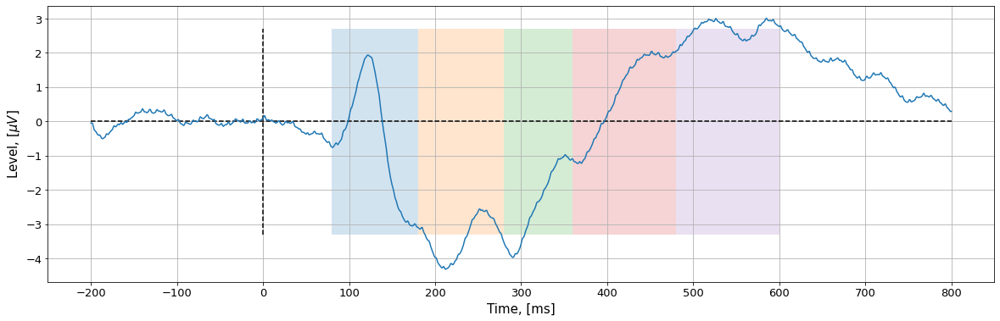

Files Loaded:  S13.edf.mrk S13.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S14.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1928999  =      0.000 ...  1928.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 30 components
Fitting ICA took 200.7s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 6 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


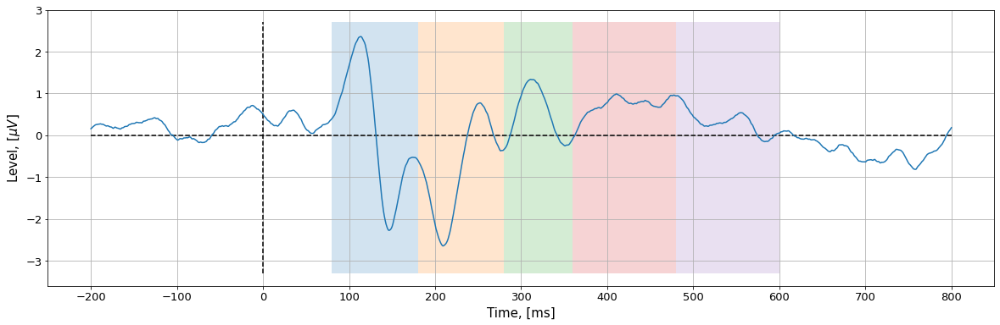

Files Loaded:  S14.edf.mrk S14.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S15.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2104999  =      0.000 ...  2104.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 18 components
Fitting ICA took 91.9s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (18 components)
    Zeroing out 3 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


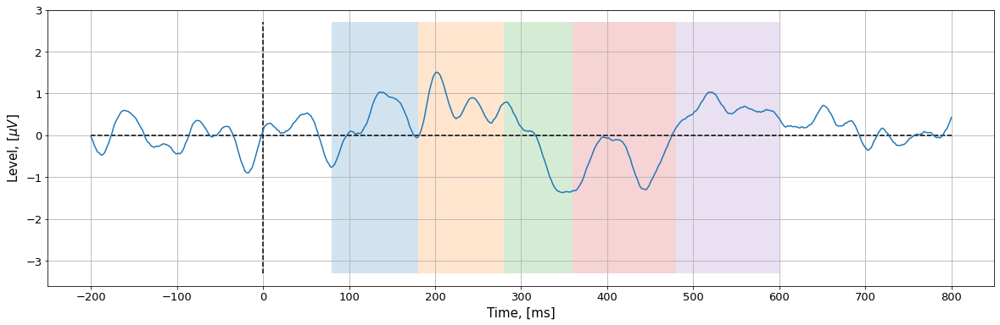

Files Loaded:  S15.edf.mrk S15.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2002999  =      0.000 ...  2002.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 27 components
Fitting ICA took 119.0s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 4 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


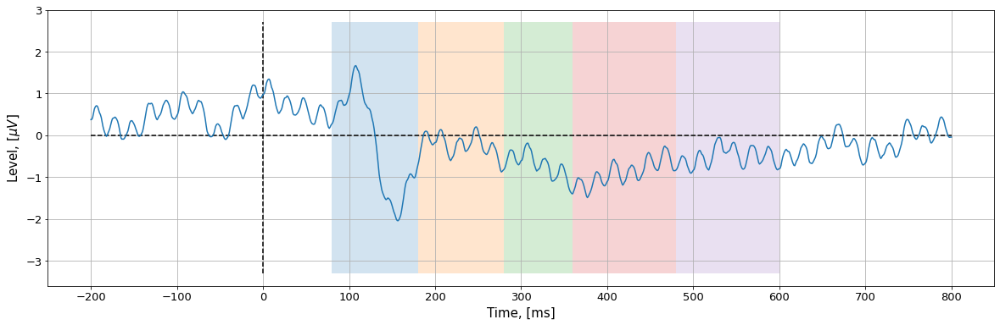

Files Loaded:  S16.edf.mrk S16.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S17.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2215999  =      0.000 ...  2215.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 34 components
Fitting ICA took 231.9s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (34 components)
    Zeroing out 6 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


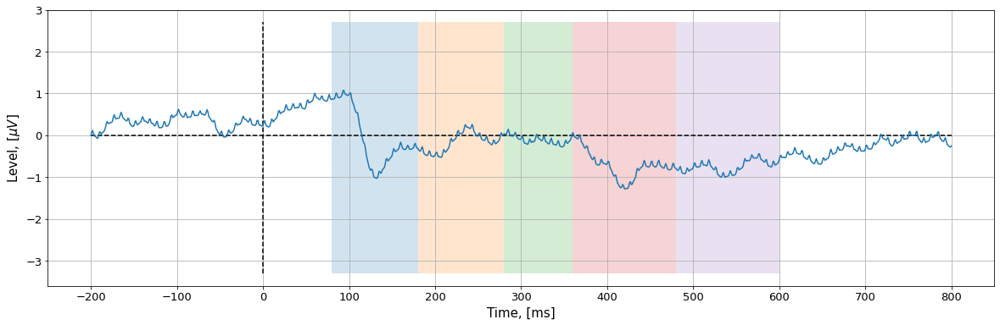

Files Loaded:  S17.edf.mrk S17.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S18.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2109999  =      0.000 ...  2109.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 21 components
Fitting ICA took 123.2s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (21 components)
    Zeroing out 3 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


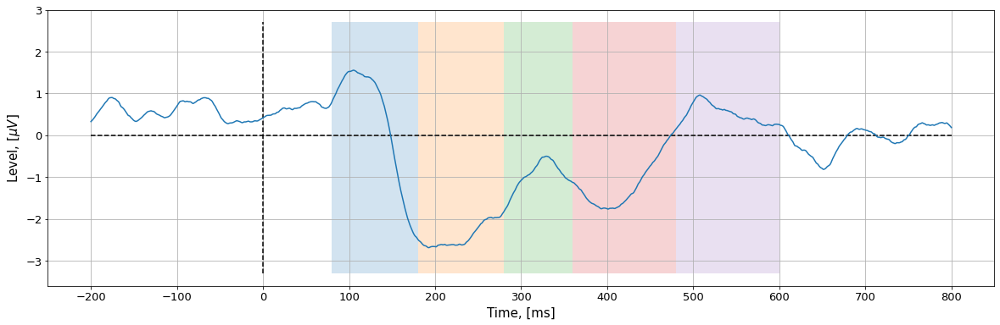

Files Loaded:  S18.edf.mrk S18.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S19.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2095999  =      0.000 ...  2095.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 14 components
Fitting ICA took 66.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 3 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


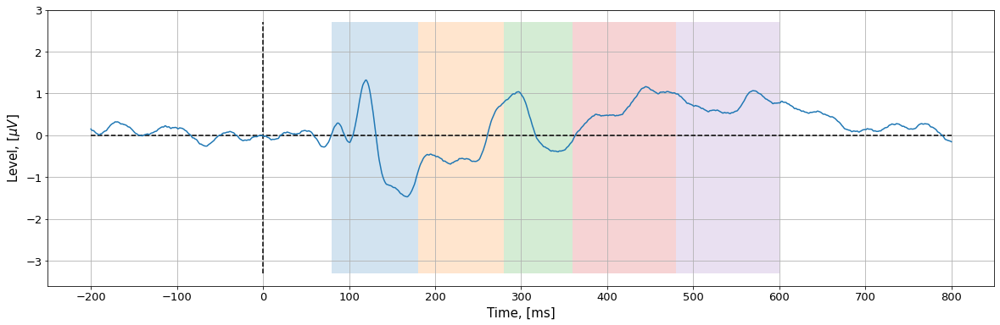

Files Loaded:  S19.edf.mrk S19.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S20.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2218999  =      0.000 ...  2218.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 29 components
Fitting ICA took 206.8s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 3 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


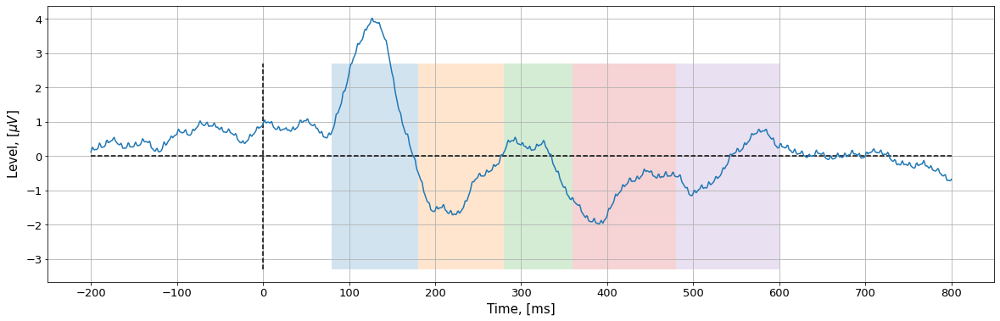

Files Loaded:  S20.edf.mrk S20.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1843999  =      0.000 ...  1843.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 26 components
Fitting ICA took 134.7s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (26 components)
    Zeroing out 6 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


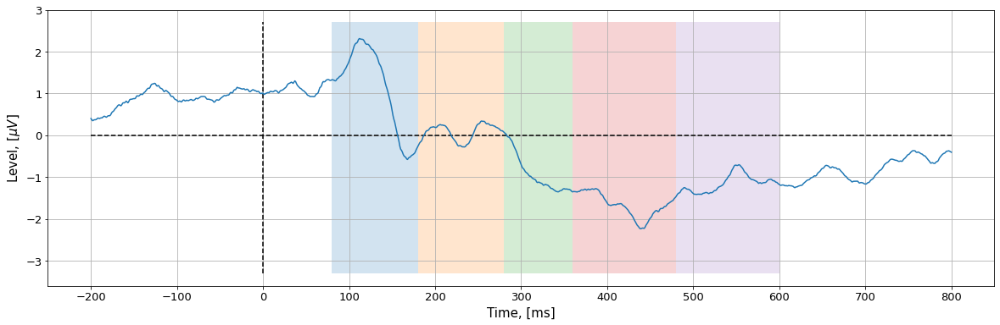

Files Loaded:  S01.edf.mrk S01.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S02.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2357999  =      0.000 ...  2357.999 secs...

=== REJECT ===

=== ICA ===
Fitting ICA to data using 49 channels (please be patient, this may take a while)
Selecting by explained variance: 23 components
Fitting ICA took 134.1s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (23 components)
    Zeroing out 6 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


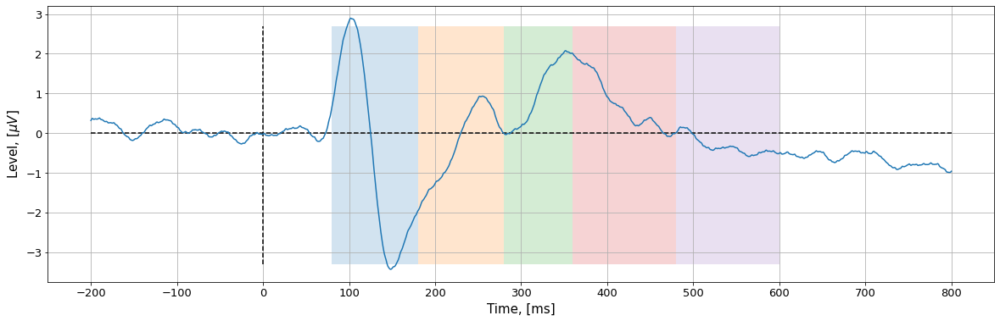

Files Loaded:  S02.edf.mrk S02.edf




In [ ]:
get_eeg_plot('./')

In [ ]:
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs, corrmap)

In [ ]:
FILE_EEG_PLOT(files_igt[0], files_eeg[18]) # S01
FILE_EEG_PLOT(files_igt[0], files_eeg[18]) # S01

In [ ]:
files_igt[9], files_eeg[8]

('S11.edf.mrk', 'S11.edf')

In [ ]:
FILE_EEG_PLOT(files_igt[9], files_eeg[8])

In [ ]:
!pip uninstall matplotlib
!pip install matplotlib==3.1.3

# **2. Functions Application** 

In [ ]:
files_eeg[0], files_igt[1]

('S03.edf', 'S03.edf.mrk')

In [ ]:
eg = mne.io.read_raw_edf(files_eeg[0])
igt = pd.read_csv(files_igt[1])

Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [ ]:
eeg = DROP_CHANNELS(eg)

In [ ]:
eeg = DIGITIZING_IO(eg)

In [ ]:
eeg = DROP_CHANNELS(eeg)

In [ ]:
eeg.copy().set_montage(easycap_montage)

<RawEDF | S03.edf, 49 x 1856000 (1856.0 s), ~72 kB, data not loaded>

In [ ]:
eeg_filt = FILTER_40(eeg)

Reading 0 ... 1855999  =      0.000 ...  1855.999 secs...


In [ ]:
eeg_filt_reject = REJECT(eeg_filt) # = epochs_ica

Not setting metadata
1856 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1856 events and 1001 original time points ...
1 bad epochs dropped


In [ ]:
reject_ = get_rejection_threshold(eeg_filt_reject);
reject_

Estimating rejection dictionary for eeg
Estimating rejection dictionary for eog


{'eeg': 0.0009512274350317632, 'eog': 0.00013488975356679635}

In [ ]:
from mne.preprocessing import (ICA, create_eog_epochs, create_ecg_epochs, corrmap)
eeg_filt_reject_ica = ICA_REJECT_99(eeg_filt_reject)

Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00017332142403542715}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-14-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 30 components
Fitting ICA took 122.9s.


In [ ]:
!pip uninstall matplotlib
!pip install matplotlib==3.1.3

Found existing installation: matplotlib 3.5.3
Uninstalling matplotlib-3.5.3:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.3-py3.7-nspkg.pth
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.3.dist-info/*
    /usr/local/lib/python3.7/dist-packages/matplotlib/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid1/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axisartist/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/tests/*
    /usr/local/lib/python3.7/dist-packages/pylab.py
Proceed (y/n)? y
  Successfully uninstalled matplotlib-3.5.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.1 MB 6.9 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are i

Creating RawArray with float64 data, n_channels=30, n_times=1856000
    Range : 0 ... 1855999 =      0.000 ...  1855.999 secs
Ready.


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # array has the wrong kind or shape, raise the error during one-at-a-time


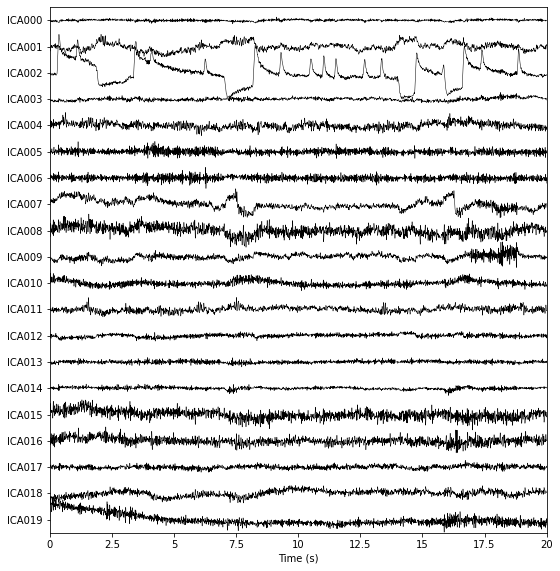

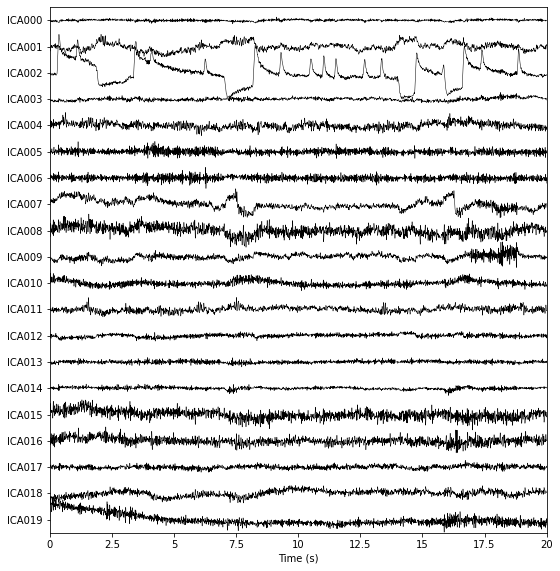

In [ ]:
eeg_filt_reject_ica.plot_sources(eeg_filt, show_scrollbars=False)

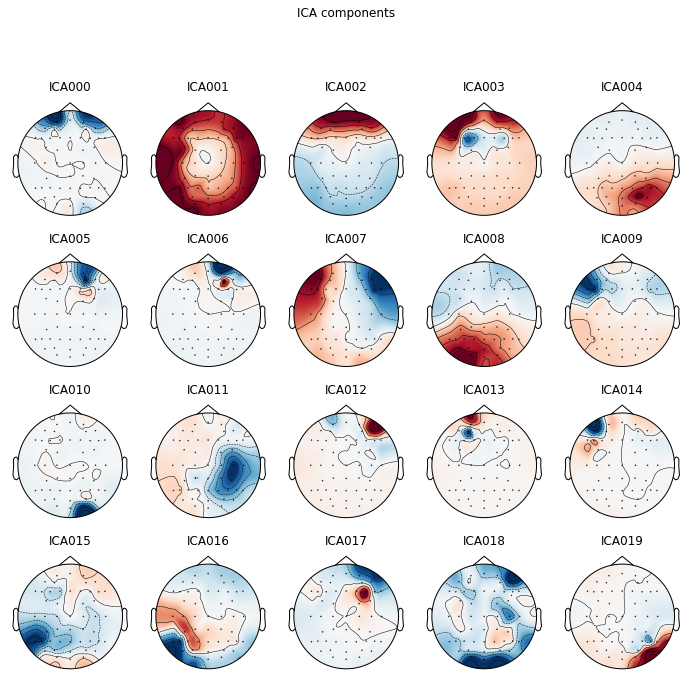

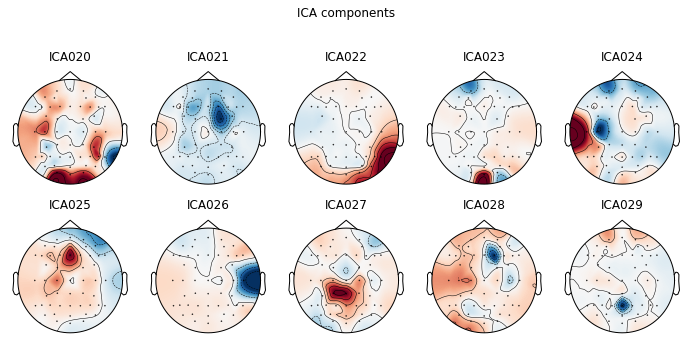

[<MNEFigure size 702x696.24 with 20 Axes>,
 <MNEFigure size 702x357.12 with 10 Axes>]

In [ ]:
eeg_filt_reject_ica.plot_components()

Effective window size : 0.256 (s)


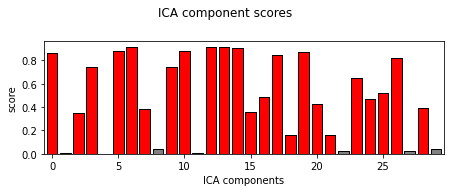

Automatically found muscle artifact ICA components: [0, 2, 3, 5, 6, 7, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 28]


In [ ]:
muscle_idx, scores = eeg_filt_reject_ica.copy().find_bads_muscle(eeg_filt)
eeg_filt_reject_ica.copy().plot_scores(scores, exclude=muscle_idx)
print(f'Automatically found muscle artifact ICA components: {muscle_idx}')

Using EOG channels: Fp1, F8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    7.5s finished


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.9s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz


[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    6.8s finished


- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


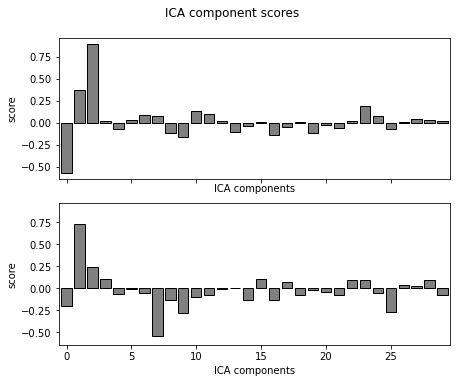

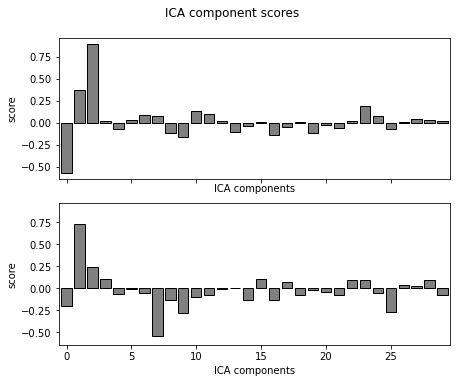

In [ ]:
eeg_filt_reject_ica.copy().exclude = []
# find which ICs match the EOG pattern
eog_idx, eog_scores = eeg_filt_reject_ica.copy().find_bads_eog(eeg_filt, ch_name=['Fp1', 'F8'])
eeg_filt_reject_ica.copy().exclude = eog_idx

# barplot of ICA component "EOG match" scores
eeg_filt_reject_ica.copy().plot_scores(eog_scores)

In [ ]:
eeg_filt_reject_ica_clean = ARTIFACTS_REMOVING_IO(eeg_filt_reject_ica, eeg_filt)

Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 24 ICA components
    Projecting back using 49 PCA components


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # array has the wrong kind or shape, raise the error during one-at-a-time


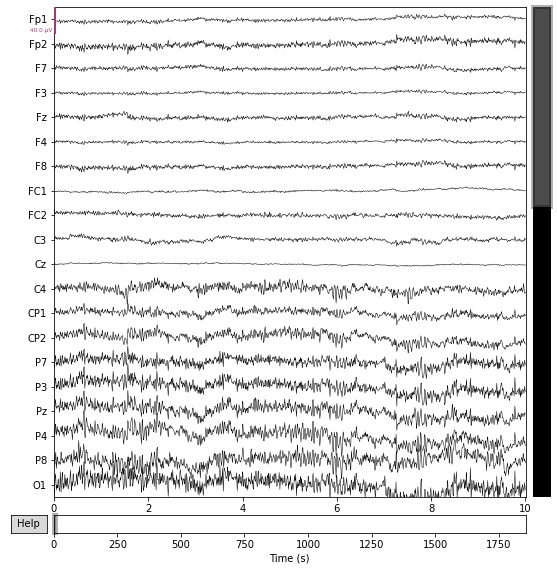

Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 0 ICA components
    Projecting back using 49 PCA components


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # array has the wrong kind or shape, raise the error during one-at-a-time


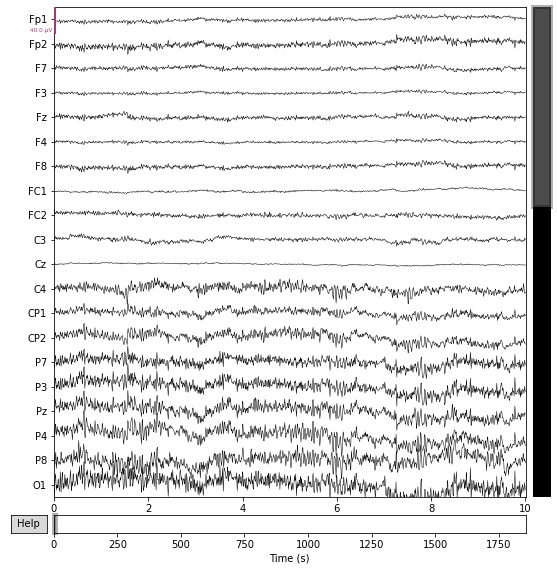

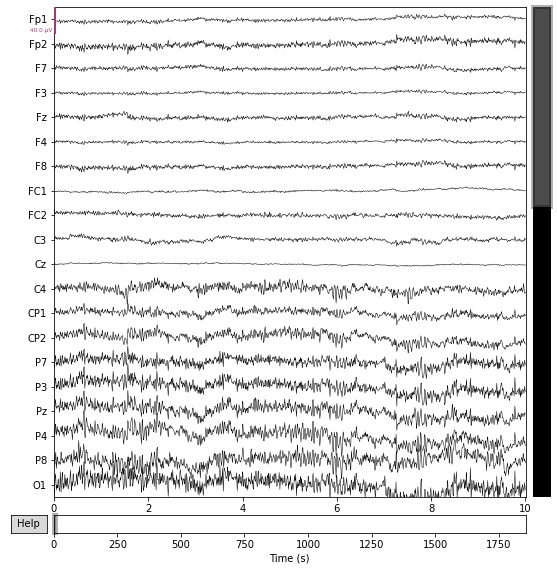

In [ ]:
eeg_filt.plot()
reconst_raw = eeg_filt.copy()
eeg_filt_reject_ica.apply(reconst_raw).plot()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


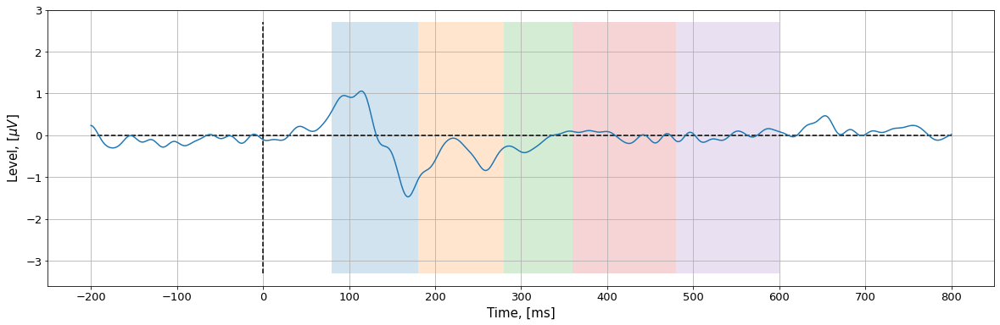

In [ ]:
events = EVENTS(igt)
eeg_filt_reject_ica_clean_frame = FRAME(eeg_filt_reject_ica_clean)
EEGdata = EEG(eeg_filt_reject_ica_clean_frame, events)
EEGdata_avg = TOTAL(EEGdata)
EEGdata_avg_plot = EEG_PLOT(EEGdata_avg)

# **3. Functions Application** 

In [ ]:
def get_dataset(file_igt, file_eeg):
    igt = pd.read_csv(file_igt)             # reading IGT data
    
    events = EVENTS(igt)                    # trigger-events file creation

    file_raw = mne.io.read_raw_edf(file_eeg)     # reading EEG data
        
    raw = DROP_CHANNELS_IO(file_raw)
    eeg = DIGITIZING_IO(raw)
    
    print('')
    print('=== FILTER ===')
    file_eeg_filt = FILTER_40(eeg)          # EEG filtering
    print('')
    print('=== REJECT ===')  
    file_eeg_filt_ica = FILTER_ICA(eeg)       
    file_eeg_filt_reject = REJECT(file_eeg_filt_ica)
    print('')
    print('=== ICA ===')
    file_eeg_filt_reject_ica = ICA_REJECT_99(file_eeg_filt_reject)
    print('')
    print('=== ARTIFACTS ===')
    file_eeg_filt_reject_ica_clean = ARTIFACTS_REMOVING_IO(file_eeg_filt_reject_ica, file_eeg_filt)
    print('')
    print('=== PLOT ===')
    file_eeg_filt_reject_ica_clean_frame = FRAME(file_eeg_filt_reject_ica_clean)
    
    EEGdata = EEG(file_eeg_filt_reject_ica_clean_frame, events)  
    EEGdata_avg = TOTAL(EEGdata)
    EEGdata_avg_plot = EEG_PLOT(EEGdata_avg)
  
    return EEGdata_avg_plot

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1855999  =      0.000 ...  1855.999 secs...

=== REJECT ===
Not setting metadata
1856 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1856 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00017140894831625095}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 24 components
Fitting ICA took 114.2s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (24 components)
    Zeroing out 19 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


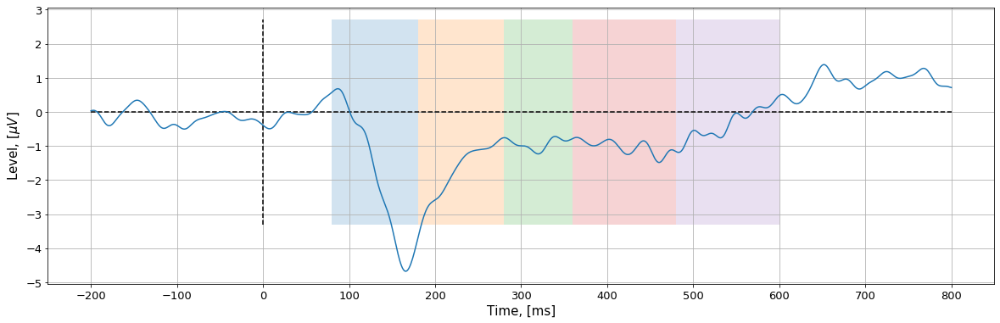

In [ ]:
get_dataset('./S03.edf.mrk', './S03.edf')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1855999  =      0.000 ...  1855.999 secs...

=== REJECT ===
Not setting metadata
1856 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1856 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00017140894831625095}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 24 components
Fitting ICA took 123.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (24 components)
    Zeroing out 19 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


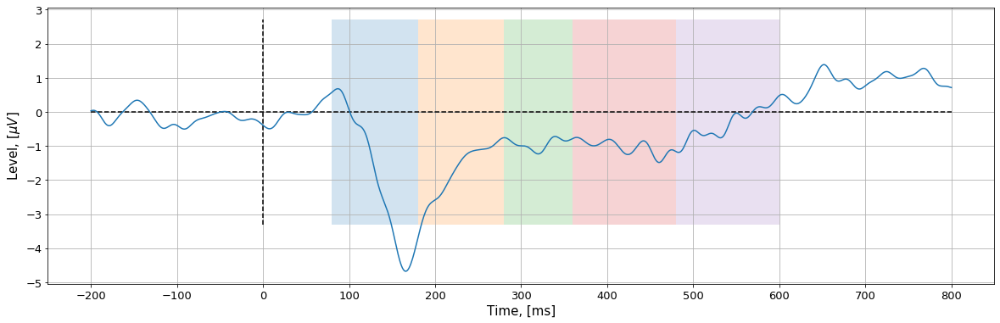

Files Loaded:  S03.edf.mrk S03.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1829999  =      0.000 ...  1829.999 secs...

=== REJECT ===
Not setting metadata
1830 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1830 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00010511894364382125}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 27 components
Fitting ICA took 210.9s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 25 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


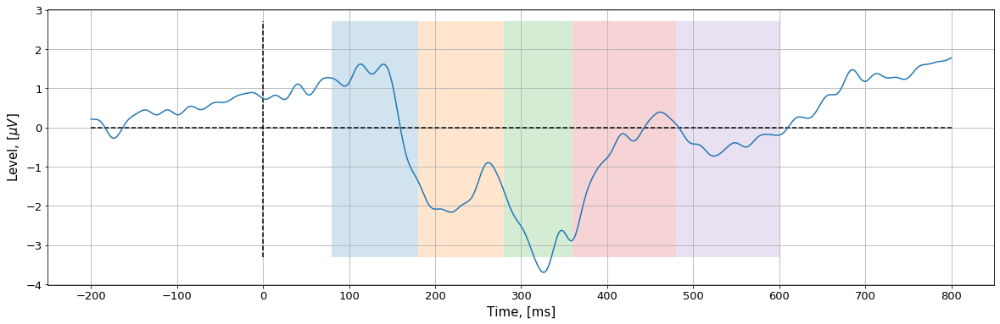

Files Loaded:  S04.edf.mrk S04.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1981999  =      0.000 ...  1981.999 secs...

=== REJECT ===
Not setting metadata
1982 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1982 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00014666222249833094}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 20 components
Fitting ICA took 82.8s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 12 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


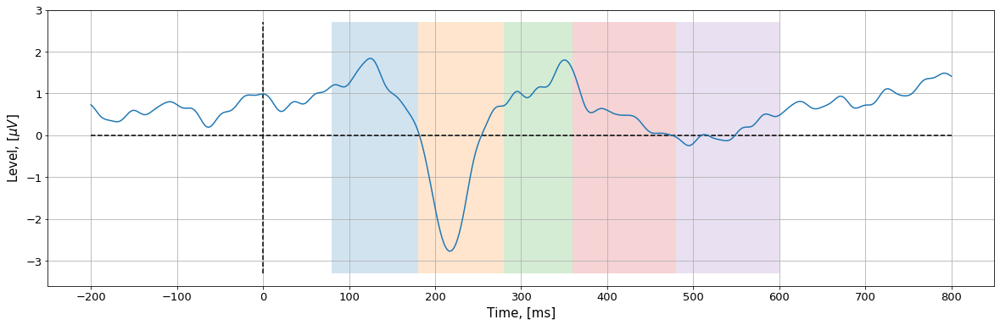

Files Loaded:  S05.edf.mrk S05.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S06.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2379999  =      0.000 ...  2379.999 secs...

=== REJECT ===
Not setting metadata
2380 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2380 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 8.901259794412327e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 21 components
Fitting ICA took 123.8s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (21 components)
    Zeroing out 17 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


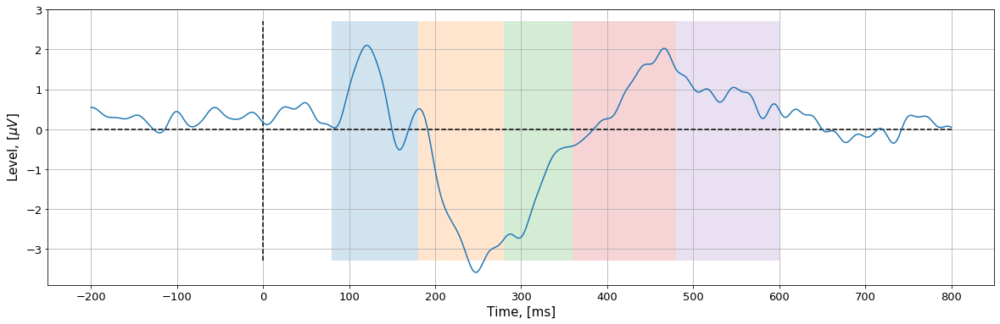

Files Loaded:  S06.edf.mrk S06.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1994999  =      0.000 ...  1994.999 secs...

=== REJECT ===
Not setting metadata
1995 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1995 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00010200942984394147}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 22 components
Fitting ICA took 77.5s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 14 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


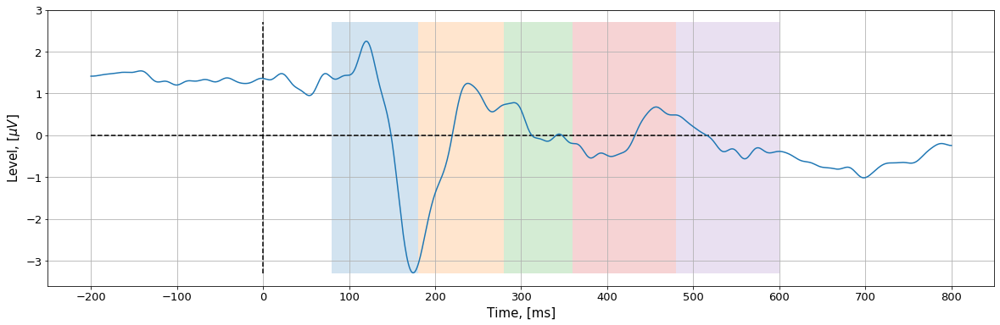

Files Loaded:  S07.edf.mrk S07.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2145999  =      0.000 ...  2145.999 secs...

=== REJECT ===
Not setting metadata
2146 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2146 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 8.459747512964384e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 27 components
Fitting ICA took 194.3s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 26 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


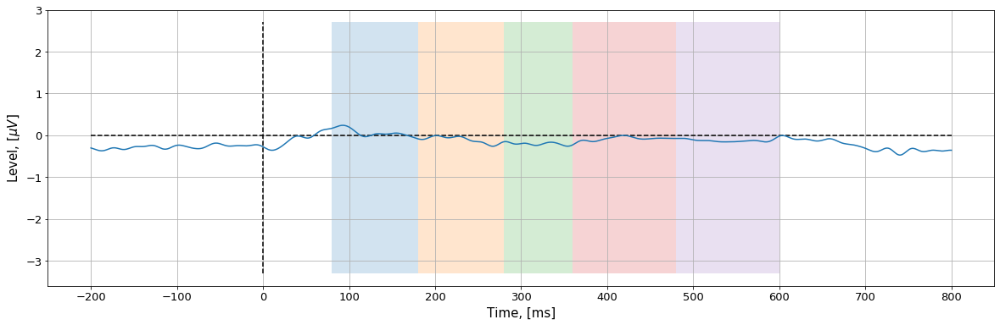

Files Loaded:  S08.edf.mrk S08.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1850999  =      0.000 ...  1850.999 secs...

=== REJECT ===
Not setting metadata
1851 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1851 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00026704397310250766}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 12 components
Fitting ICA took 41.8s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (12 components)
    Zeroing out 8 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


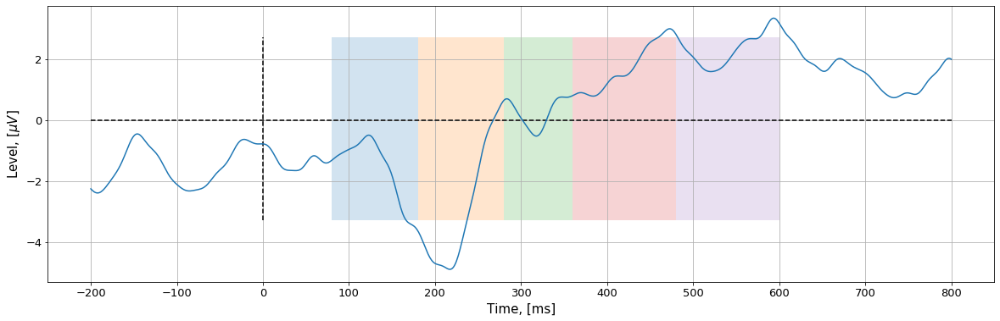

Files Loaded:  S09.edf.mrk S09.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S10.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1924999  =      0.000 ...  1924.999 secs...

=== REJECT ===
Not setting metadata
1925 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1925 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.0001385526831399173}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 25 components
Fitting ICA took 152.4s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (25 components)
    Zeroing out 21 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


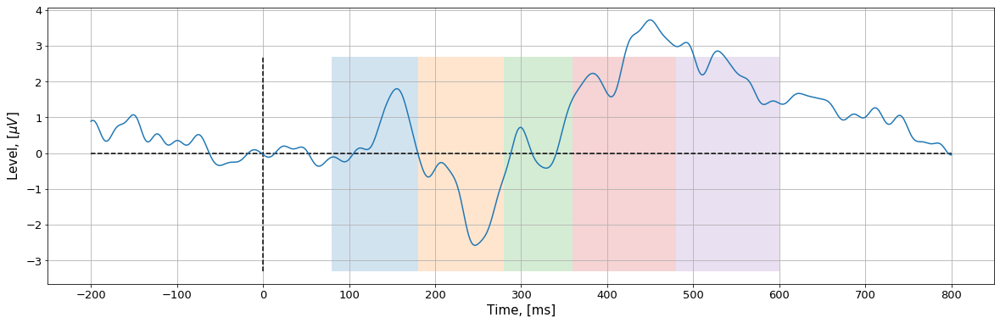

Files Loaded:  S10.edf.mrk S10.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1715999  =      0.000 ...  1715.999 secs...

=== REJECT ===
Not setting metadata
1716 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1716 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 9.273839465940419e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 25 components
Fitting ICA took 120.2s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (25 components)
    Zeroing out 17 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


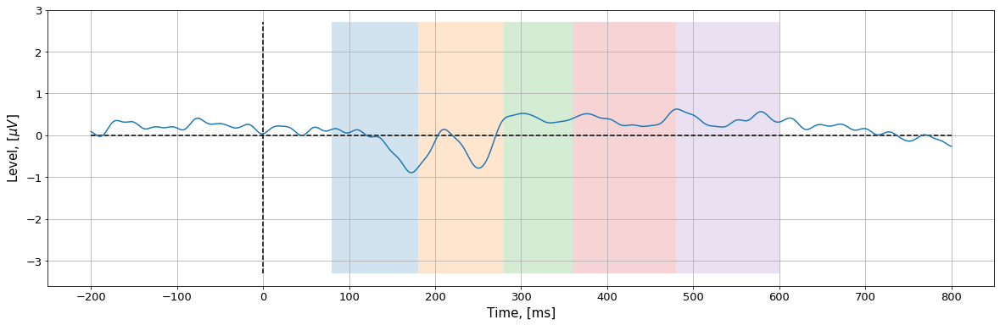

Files Loaded:  S11.edf.mrk S11.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2035999  =      0.000 ...  2035.999 secs...

=== REJECT ===
Not setting metadata
2036 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2036 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 8.521157585836275e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 22 components
Fitting ICA took 156.1s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 19 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


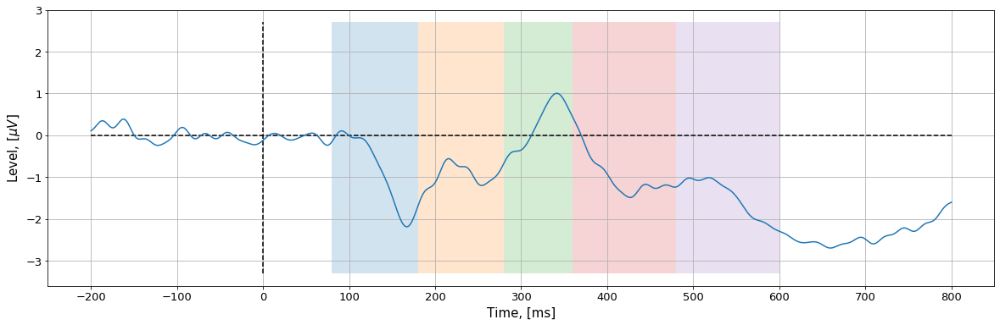

Files Loaded:  S12.edf.mrk S12.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1924999  =      0.000 ...  1924.999 secs...

=== REJECT ===
Not setting metadata
1925 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1925 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 6.086293842402225e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 28 components
Fitting ICA took 131.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (28 components)
    Zeroing out 21 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


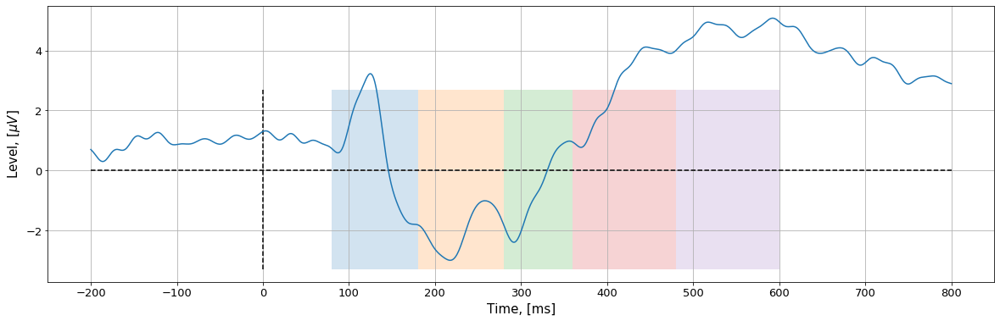

Files Loaded:  S13.edf.mrk S13.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S14.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1928999  =      0.000 ...  1928.999 secs...

=== REJECT ===
Not setting metadata
1929 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1929 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00011876845417517765}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 30 components
Fitting ICA took 172.2s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 22 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


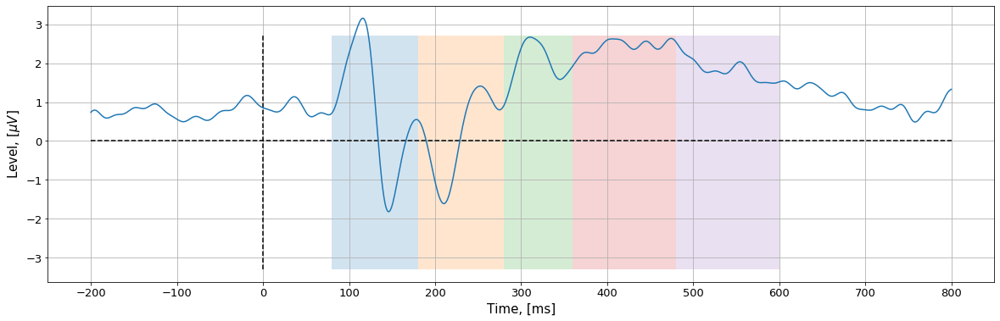

Files Loaded:  S14.edf.mrk S14.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S15.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2104999  =      0.000 ...  2104.999 secs...

=== REJECT ===
Not setting metadata
2105 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2105 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.0003927596655520321}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 19 components
Fitting ICA took 112.1s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (19 components)
    Zeroing out 13 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


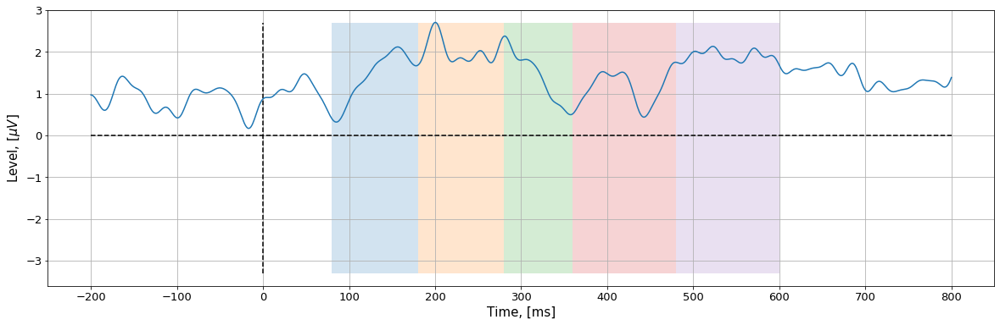

Files Loaded:  S15.edf.mrk S15.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2002999  =      0.000 ...  2002.999 secs...

=== REJECT ===
Not setting metadata
2003 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2003 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00013677677483234593}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 27 components
Fitting ICA took 93.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 18 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


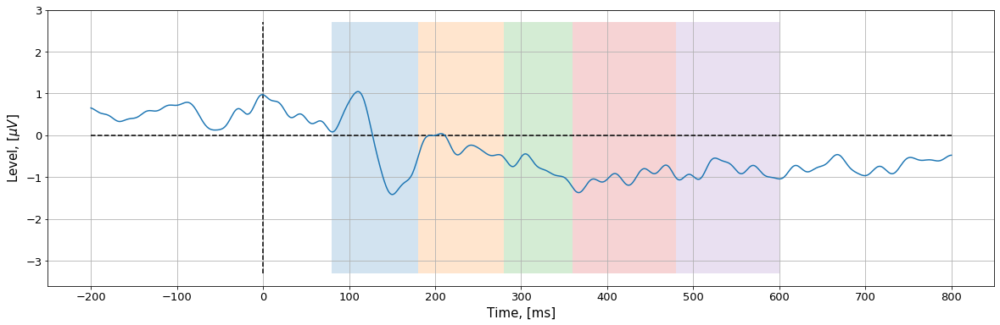

Files Loaded:  S16.edf.mrk S16.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S17.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2215999  =      0.000 ...  2215.999 secs...

=== REJECT ===
Not setting metadata
2216 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2216 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00014425604694005194}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 34 components
Fitting ICA took 299.4s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (34 components)
    Zeroing out 27 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


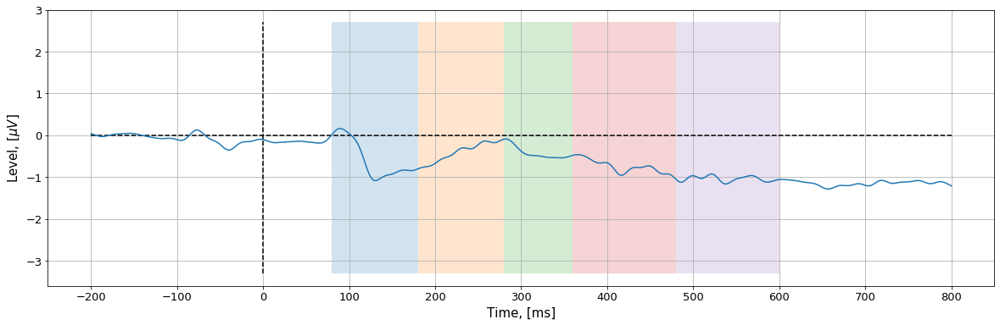

Files Loaded:  S17.edf.mrk S17.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S18.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2109999  =      0.000 ...  2109.999 secs...

=== REJECT ===
Not setting metadata
2110 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2110 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 8.124358476712147e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 21 components
Fitting ICA took 117.9s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (21 components)
    Zeroing out 15 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


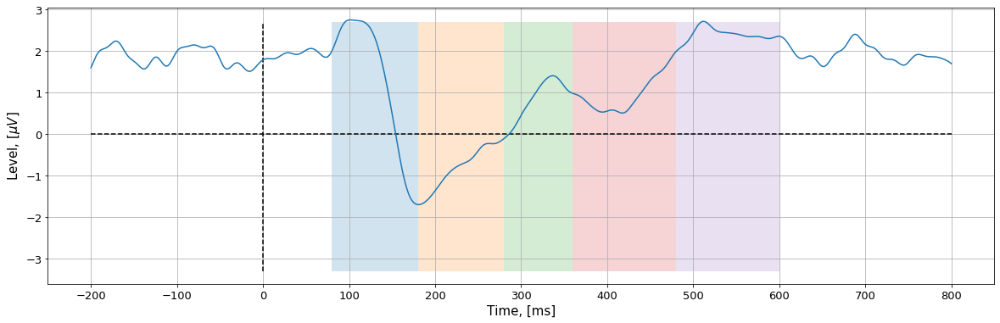

Files Loaded:  S18.edf.mrk S18.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S19.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2095999  =      0.000 ...  2095.999 secs...

=== REJECT ===
Not setting metadata
2096 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2096 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 8.468181294521697e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 15 components
Fitting ICA took 75.4s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 11 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


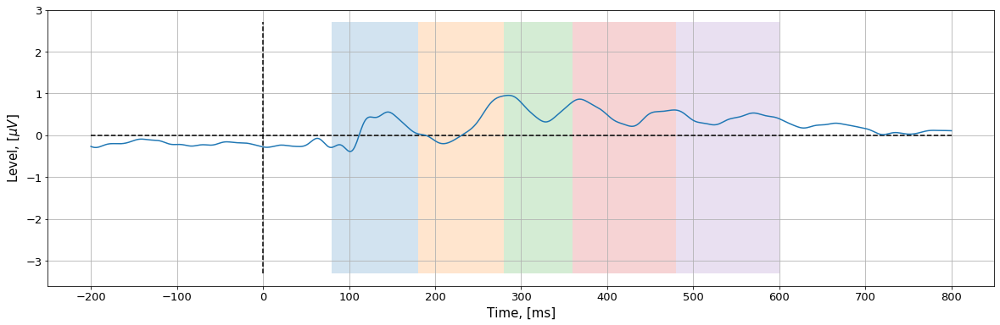

Files Loaded:  S19.edf.mrk S19.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S20.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2218999  =      0.000 ...  2218.999 secs...

=== REJECT ===
Not setting metadata
2219 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2219 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 9.019609622247328e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 29 components
Fitting ICA took 181.8s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 23 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


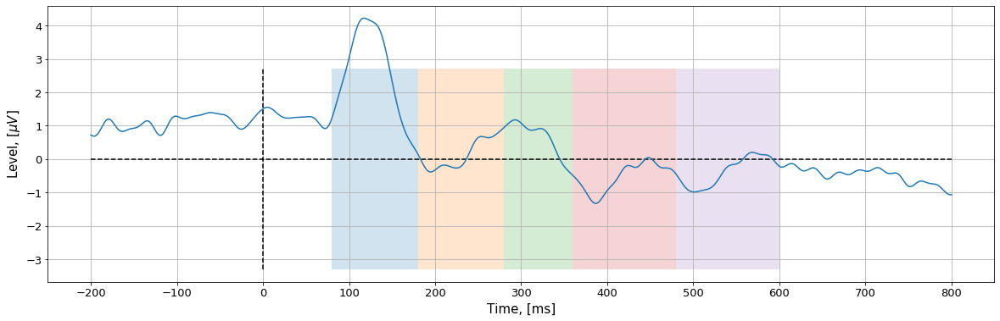

Files Loaded:  S20.edf.mrk S20.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1843999  =      0.000 ...  1843.999 secs...

=== REJECT ===
Not setting metadata
1844 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1844 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 5.978773516675648e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 26 components
Fitting ICA took 169.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (26 components)
    Zeroing out 18 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


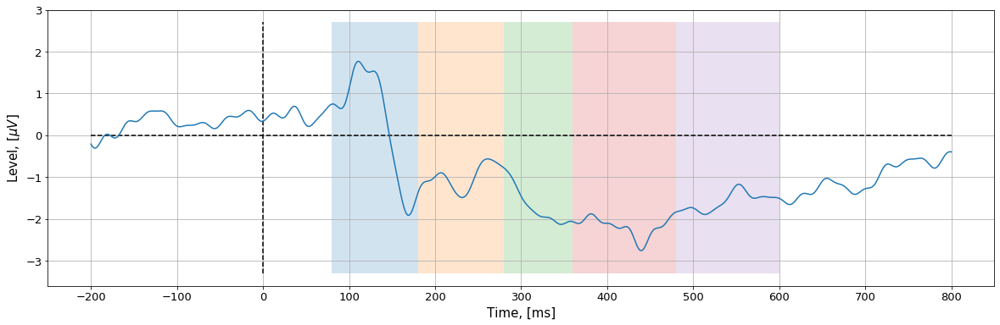

Files Loaded:  S01.edf.mrk S01.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S02.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2357999  =      0.000 ...  2357.999 secs...

=== REJECT ===
Not setting metadata
2358 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2358 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 9.329137365994509e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 24 components
Fitting ICA took 94.5s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (24 components)
    Zeroing out 19 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


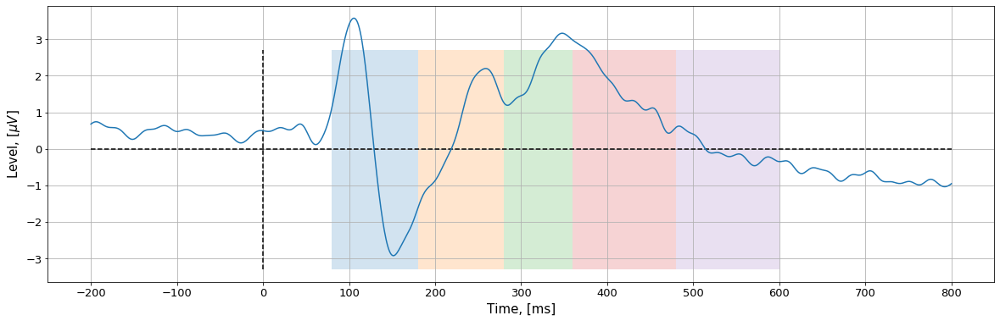

Files Loaded:  S02.edf.mrk S02.edf




In [ ]:
get_eeg_plot('./')

In [ ]:
file_igt = './S03.edf.mrk'
file_eeg = './S03.edf'

In [ ]:
igt = pd.read_csv(file_igt)
events = EVENTS(igt)                    
file_raw = mne.io.read_raw_edf(file_eeg)          
raw = DROP_CHANNELS_IO(file_raw)
eeg = DIGITIZING_IO(raw)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


Reading 0 ... 1855999  =      0.000 ...  1855.999 secs...
Using matplotlib as 2D backend.


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:235: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


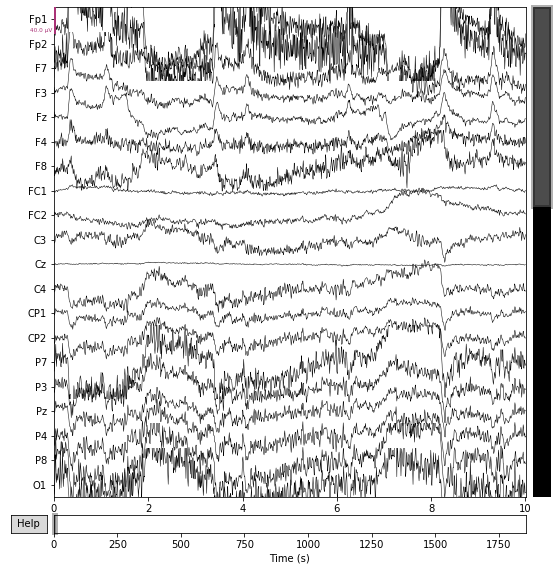

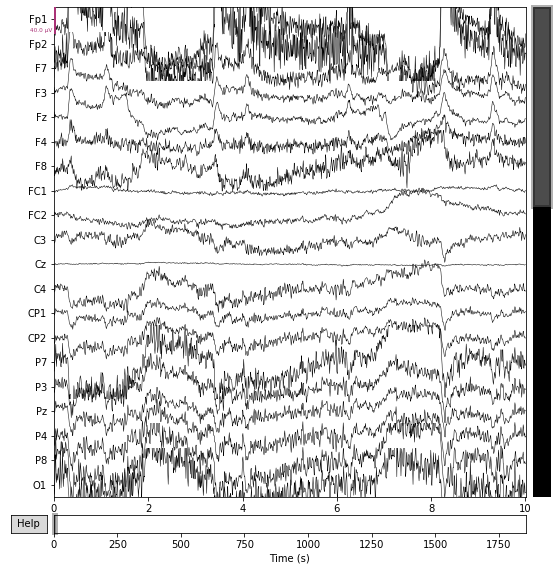

In [ ]:
eeg.load_data()
file_eeg_filt = eeg.copy().filter(l_freq=0.1, h_freq=40, fir_design='firwin', skip_by_annotation='edge', verbose="warning")
file_eeg_filt.plot()

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:235: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


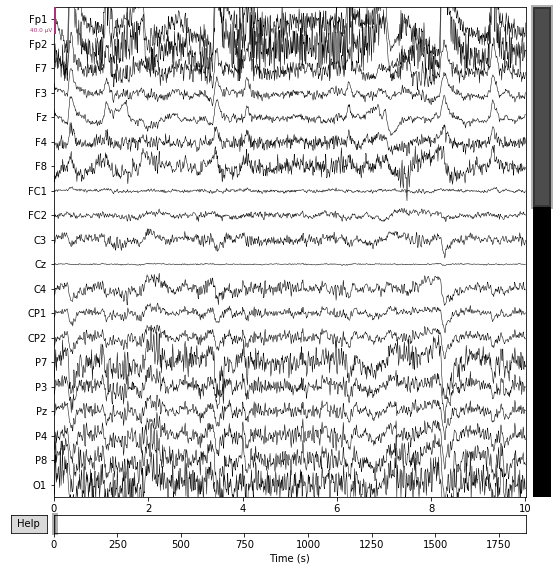

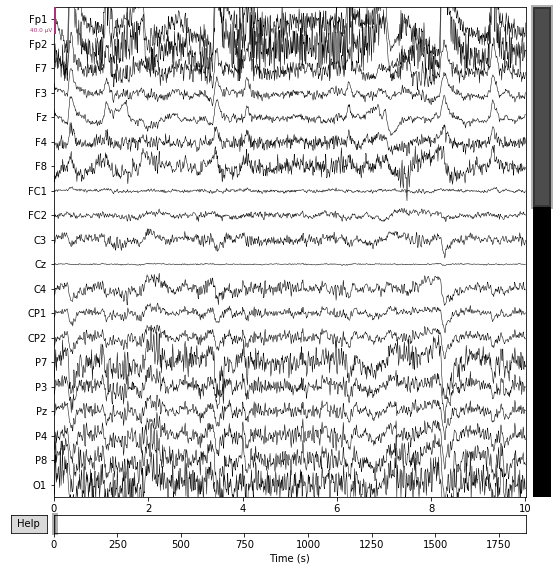

In [ ]:
eeg.load_data()
file_eeg_filt_ica = eeg.copy().filter(l_freq=1, h_freq=40, fir_design='firwin', skip_by_annotation='edge', verbose="warning")
file_eeg_filt_ica.plot()

In [ ]:
file_eeg_filt_ica_reject = REJECT(file_eeg_filt_ica)

Not setting metadata
1856 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1856 events and 1001 original time points ...
1 bad epochs dropped


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:235: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


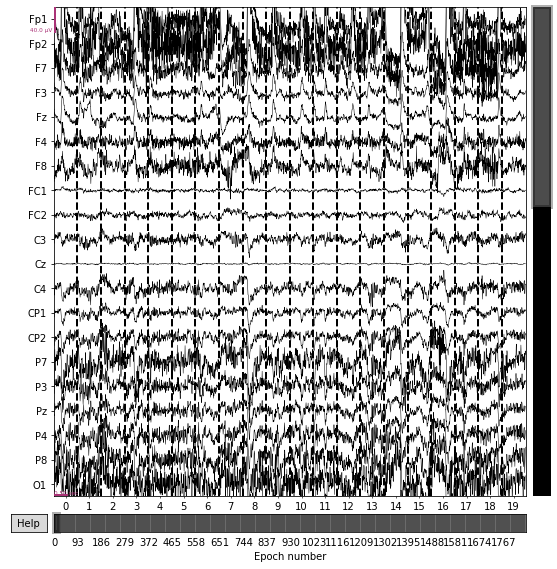

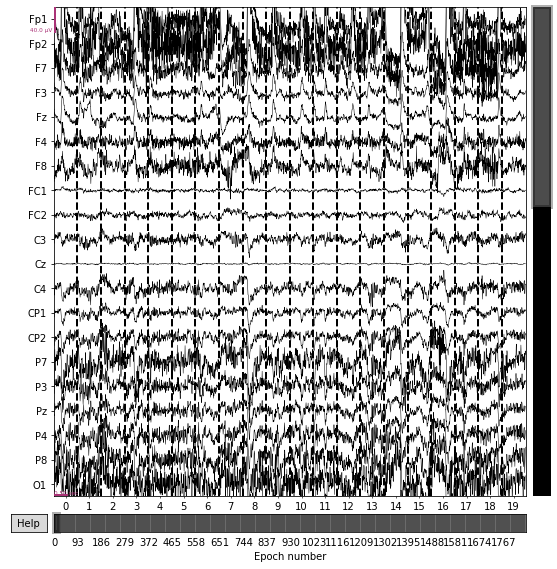

In [ ]:
file_eeg_filt_ica_reject.plot()

In [ ]:
file_eeg_filt_reject_ica = ICA_REJECT_99(file_eeg_filt_ica_reject)

Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00017140894831625095}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 24 components
Fitting ICA took 115.6s.


In [ ]:
file_eeg_filt_reject_ica_clean = ARTIFACTS_REMOVING_IO(file_eeg_filt_reject_ica, file_eeg_filt)

Applying ICA to Raw instance
    Transforming to ICA space (24 components)
    Zeroing out 19 ICA components
    Projecting back using 49 PCA components


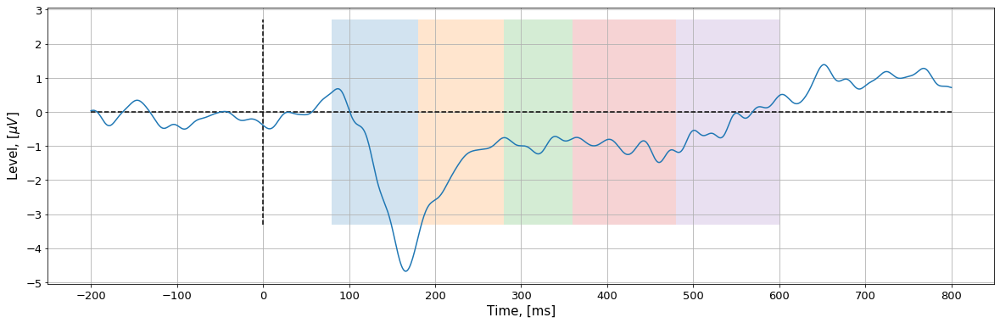

In [ ]:
file_eeg_filt_reject_ica_clean_frame = FRAME(file_eeg_filt_reject_ica_clean)
EEGdata = EEG(file_eeg_filt_reject_ica_clean_frame, events)  
EEGdata_avg = TOTAL(EEGdata)
EEGdata_avg_plot = EEG_PLOT(EEGdata_avg)

# **4. Functions Application** 

In [ ]:
def get_dataset(file_igt, file_eeg):
    igt = pd.read_csv(file_igt)             # reading IGT data
    
    events = EVENTS(igt)                    # trigger-events file creation

    file_raw = mne.io.read_raw_edf(file_eeg)     # reading EEG data
        
    raw = DROP_CHANNELS_IO(file_raw)
    eeg = DIGITIZING_IO(raw)
    
    print('')
    print('=== FILTER ===')
    file_eeg_filt = FILTER_40(eeg)          # EEG filtering
    print('')
    print('=== REJECT ===')  
         
    file_eeg_filt_reject = REJECT(file_eeg_filt)
    print('')
    print('=== ICA ===')
    file_eeg_filt_reject_ica = ICA_REJECT_99(file_eeg_filt_reject)
    print('')
    print('=== ARTIFACTS ===')
    file_eeg_filt_reject_ica_clean = ARTIFACTS_REMOVING_IO(file_eeg_filt_reject_ica, file_eeg_filt)
    print('')
    print('=== PLOT ===')
    file_eeg_filt_reject_ica_clean_frame = FRAME(file_eeg_filt_reject_ica_clean)
    
    EEGdata = EEG(file_eeg_filt_reject_ica_clean_frame, events)  
    EEGdata_avg = TOTAL(EEGdata)
    EEGdata_avg_plot = EEG_PLOT(EEGdata_avg)
  
    return EEGdata_avg_plot

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1855999  =      0.000 ...  1855.999 secs...

=== REJECT ===
Not setting metadata
1856 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1856 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00017332142403542715}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 30 components
Fitting ICA took 127.2s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 24 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


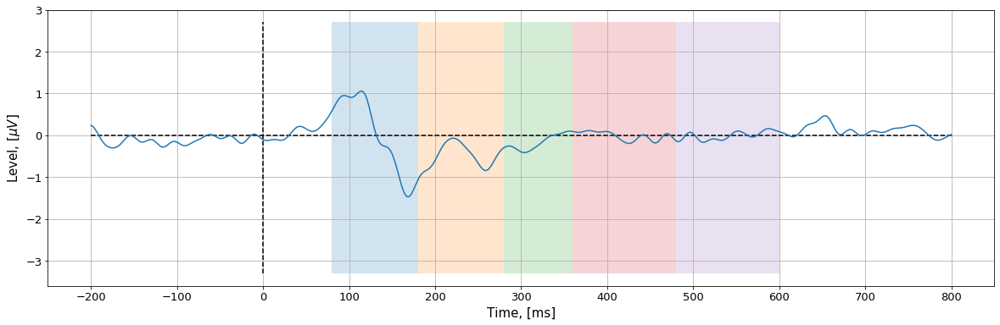

Files Loaded:  S03.edf.mrk S03.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1829999  =      0.000 ...  1829.999 secs...

=== REJECT ===
Not setting metadata
1830 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1830 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00016862418153319768}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 16 components
Fitting ICA took 83.8s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (16 components)
    Zeroing out 15 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


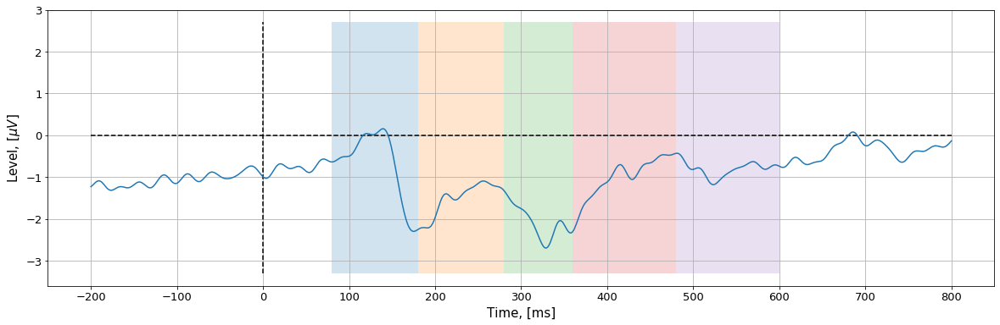

Files Loaded:  S04.edf.mrk S04.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1981999  =      0.000 ...  1981.999 secs...

=== REJECT ===
Not setting metadata
1982 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1982 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.0001665817498956662}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 32 components
Fitting ICA took 177.9s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (32 components)
    Zeroing out 12 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


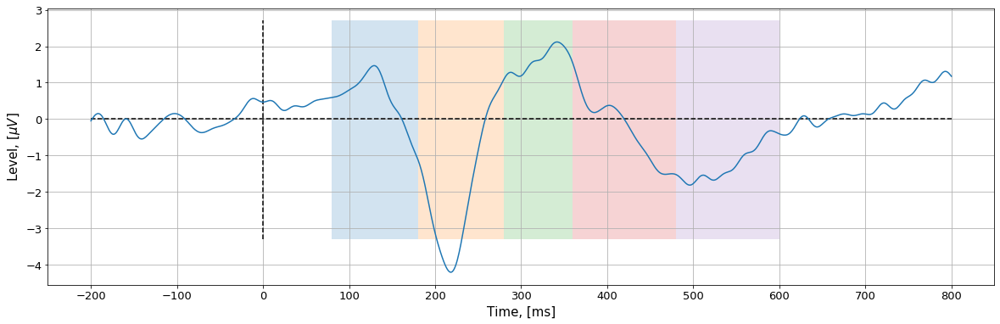

Files Loaded:  S05.edf.mrk S05.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S06.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2379999  =      0.000 ...  2379.999 secs...

=== REJECT ===
Not setting metadata
2380 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2380 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 9.660570131865895e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 23 components
Fitting ICA took 185.4s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (23 components)
    Zeroing out 19 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


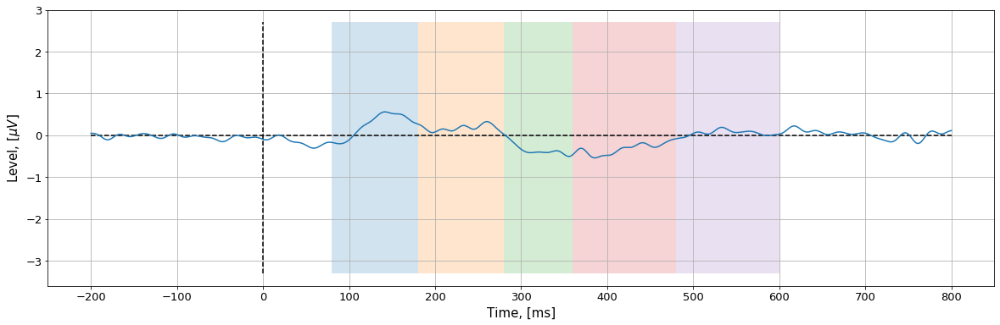

Files Loaded:  S06.edf.mrk S06.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1994999  =      0.000 ...  1994.999 secs...

=== REJECT ===
Not setting metadata
1995 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1995 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.0001041337450255164}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 33 components
Fitting ICA took 346.0s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (33 components)
    Zeroing out 28 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


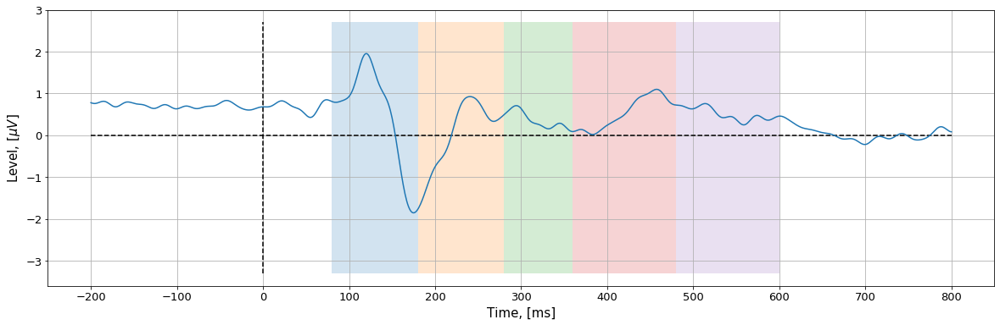

Files Loaded:  S07.edf.mrk S07.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2145999  =      0.000 ...  2145.999 secs...

=== REJECT ===
Not setting metadata
2146 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2146 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00011366528822645565}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 23 components
Fitting ICA took 181.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (23 components)
    Zeroing out 23 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


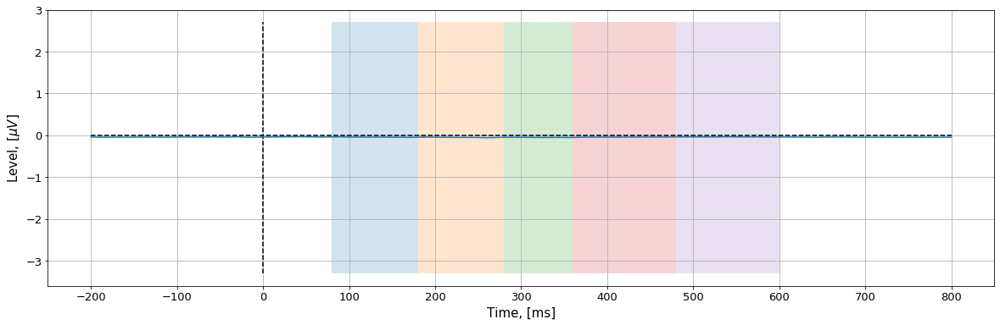

Files Loaded:  S08.edf.mrk S08.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1850999  =      0.000 ...  1850.999 secs...

=== REJECT ===
Not setting metadata
1851 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1851 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 7.551259142205439e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 7 components
Fitting ICA took 24.0s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 6 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


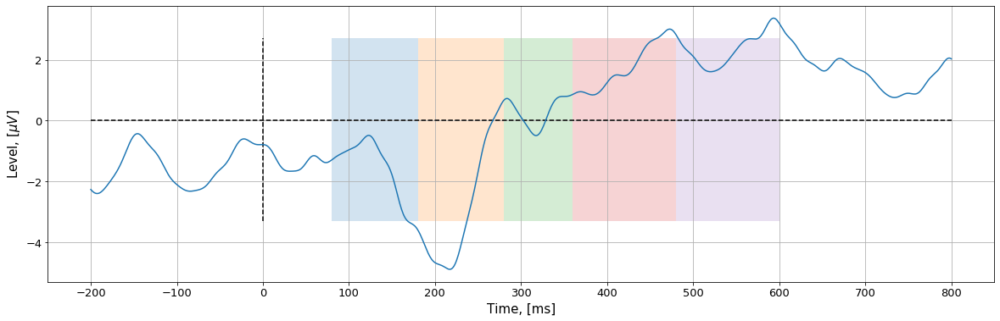

Files Loaded:  S09.edf.mrk S09.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S10.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1924999  =      0.000 ...  1924.999 secs...

=== REJECT ===
Not setting metadata
1925 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1925 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00014282573859074565}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 17 components
Fitting ICA took 55.3s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (17 components)
    Zeroing out 16 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


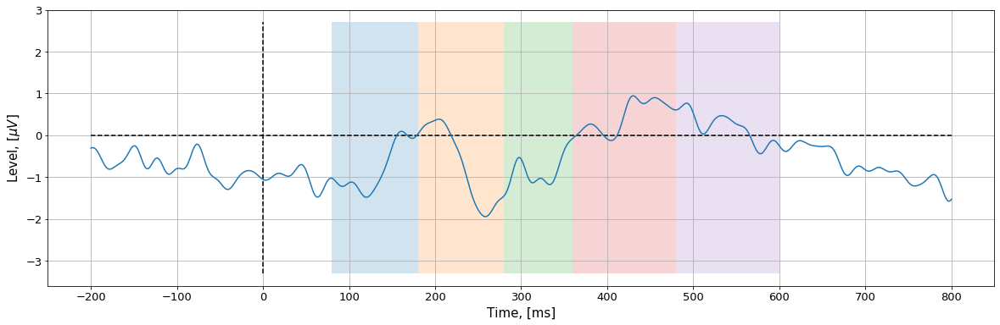

Files Loaded:  S10.edf.mrk S10.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1715999  =      0.000 ...  1715.999 secs...

=== REJECT ===
Not setting metadata
1716 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1716 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00011224042785492179}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 29 components
Fitting ICA took 93.3s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (29 components)
    Zeroing out 23 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


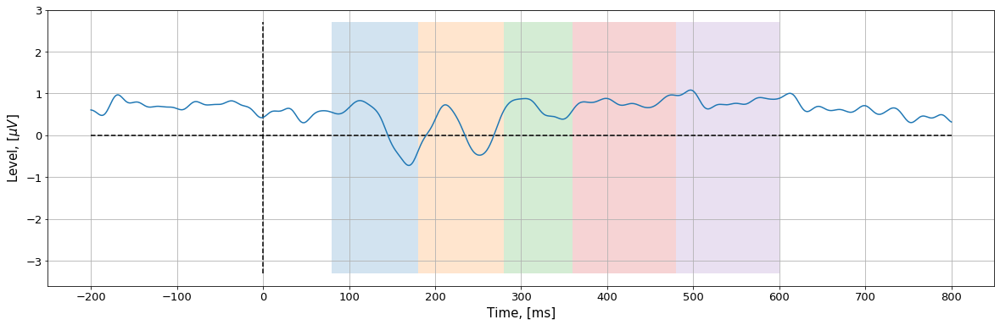

Files Loaded:  S11.edf.mrk S11.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S12.edf...
EDF file detected


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2035999  =      0.000 ...  2035.999 secs...

=== REJECT ===
Not setting metadata
2036 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2036 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 7.095451641044812e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 19 components
Fitting ICA took 99.8s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (19 components)
    Zeroing out 18 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


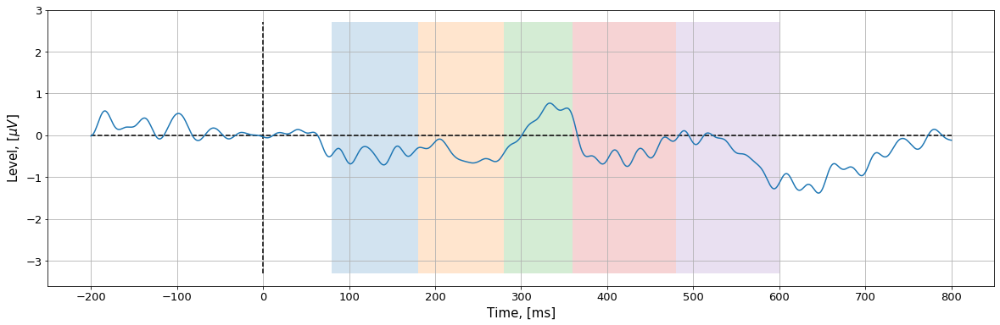

Files Loaded:  S12.edf.mrk S12.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1924999  =      0.000 ...  1924.999 secs...

=== REJECT ===
Not setting metadata
1925 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1925 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 6.558489256954688e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 30 components
Fitting ICA took 201.3s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 22 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


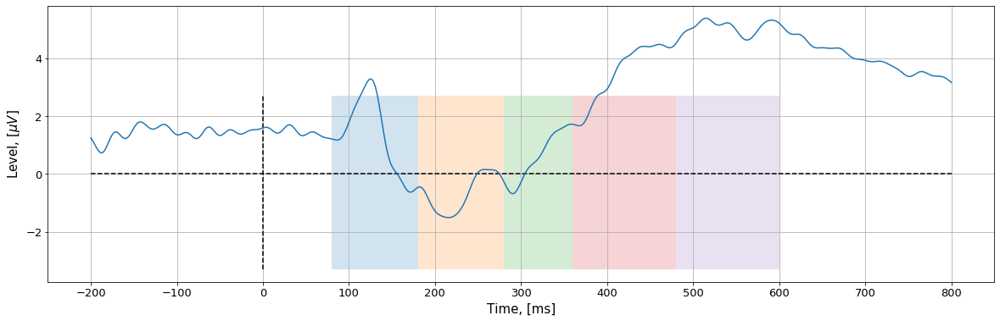

Files Loaded:  S13.edf.mrk S13.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S14.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1928999  =      0.000 ...  1928.999 secs...

=== REJECT ===
Not setting metadata
1929 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1929 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00013074606904980976}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 30 components
Fitting ICA took 183.1s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 23 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


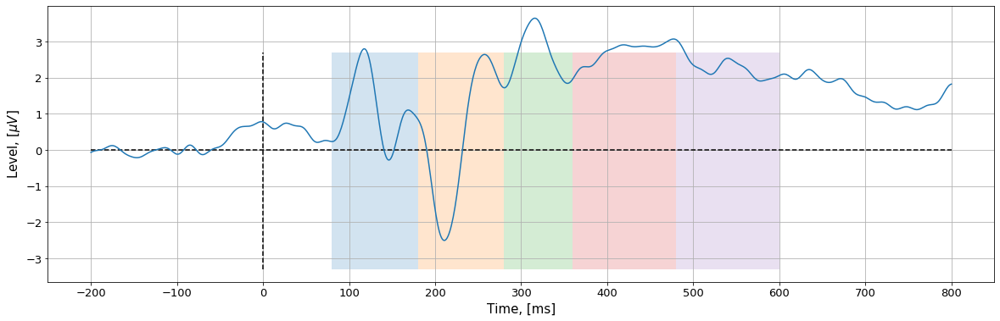

Files Loaded:  S14.edf.mrk S14.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S15.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2104999  =      0.000 ...  2104.999 secs...

=== REJECT ===
Not setting metadata
2105 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2105 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00011686425057681388}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 26 components
Fitting ICA took 144.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (26 components)
    Zeroing out 17 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


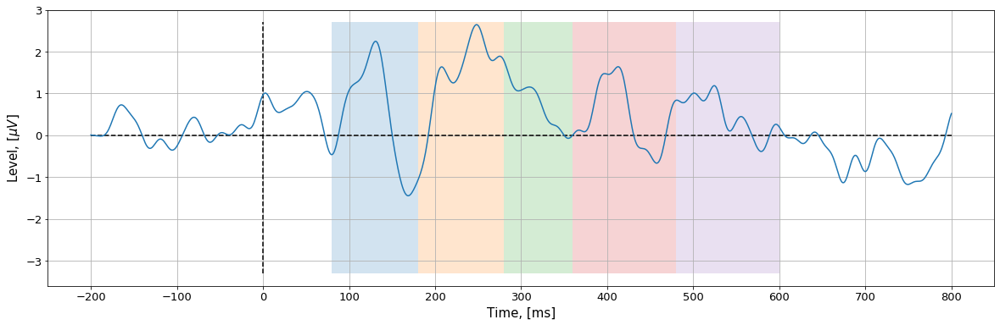

Files Loaded:  S15.edf.mrk S15.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2002999  =      0.000 ...  2002.999 secs...

=== REJECT ===
Not setting metadata
2003 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2003 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 9.349344538629514e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 30 components
Fitting ICA took 149.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 19 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


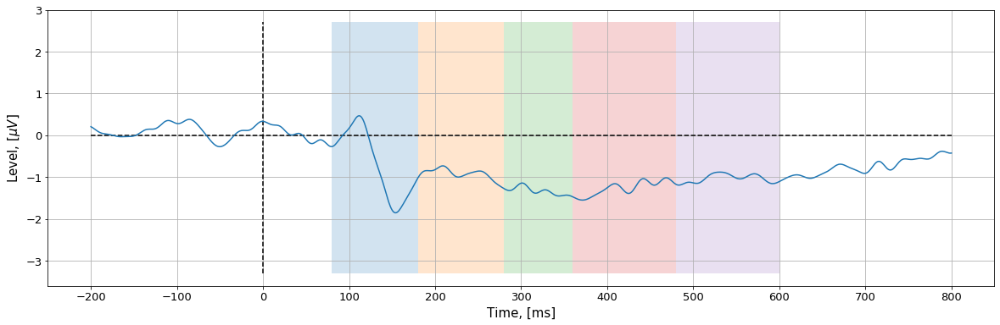

Files Loaded:  S16.edf.mrk S16.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S17.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2215999  =      0.000 ...  2215.999 secs...

=== REJECT ===
Not setting metadata
2216 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2216 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.0006966608581884328}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 34 components
Fitting ICA took 307.1s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (34 components)
    Zeroing out 33 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


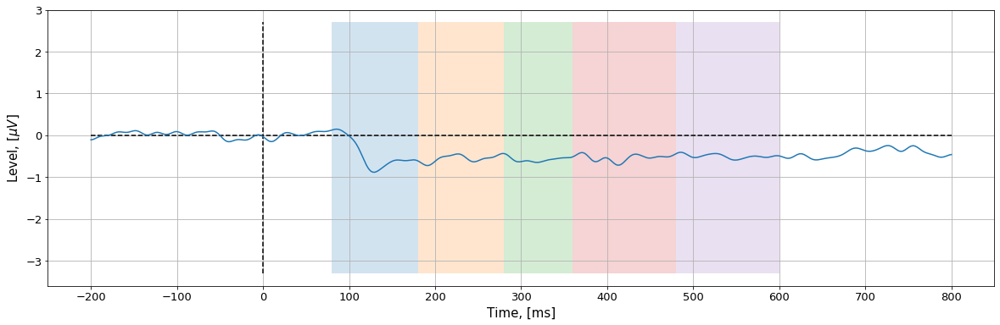

Files Loaded:  S17.edf.mrk S17.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S18.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2109999  =      0.000 ...  2109.999 secs...

=== REJECT ===
Not setting metadata
2110 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2110 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 8.465441277879143e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 36 components
Fitting ICA took 2782.2s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (36 components)
    Zeroing out 25 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


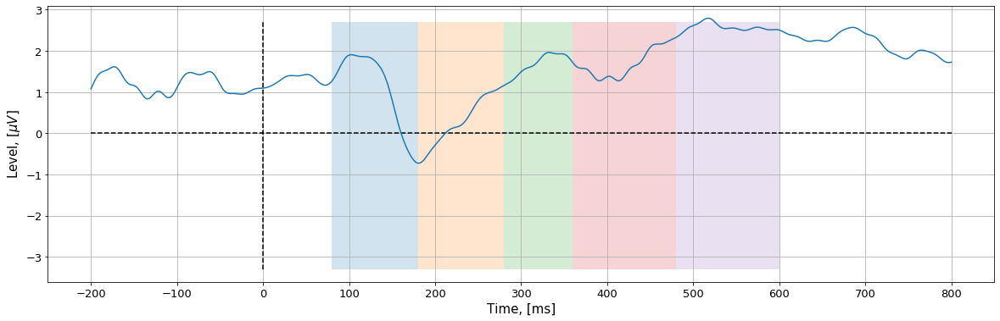

Files Loaded:  S18.edf.mrk S18.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S19.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2095999  =      0.000 ...  2095.999 secs...

=== REJECT ===
Not setting metadata
2096 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2096 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 9.08907312125528e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 16 components
Fitting ICA took 80.3s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (16 components)
    Zeroing out 9 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


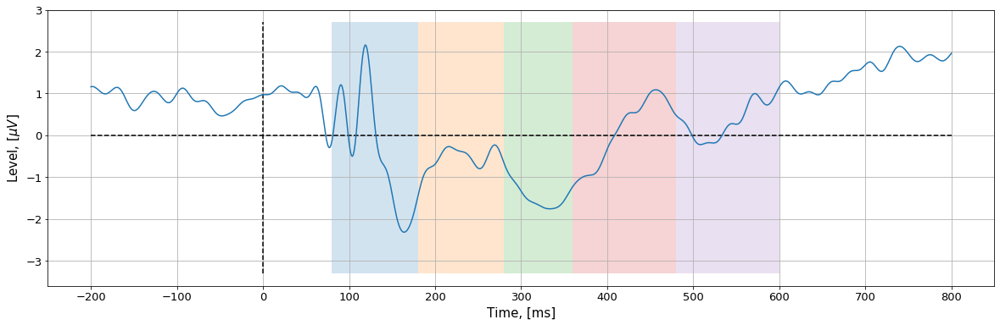

Files Loaded:  S19.edf.mrk S19.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S20.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2218999  =      0.000 ...  2218.999 secs...

=== REJECT ===
Not setting metadata
2219 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2219 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 0.00015792933661923174}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 31 components
Fitting ICA took 209.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (31 components)
    Zeroing out 22 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


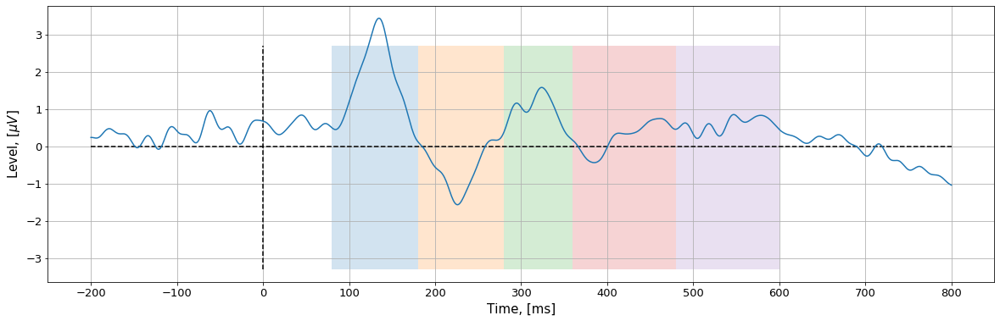

Files Loaded:  S20.edf.mrk S20.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 1843999  =      0.000 ...  1843.999 secs...

=== REJECT ===
Not setting metadata
1844 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1844 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 8.088118439847719e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 38 components
Fitting ICA took 315.6s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (38 components)
    Zeroing out 26 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


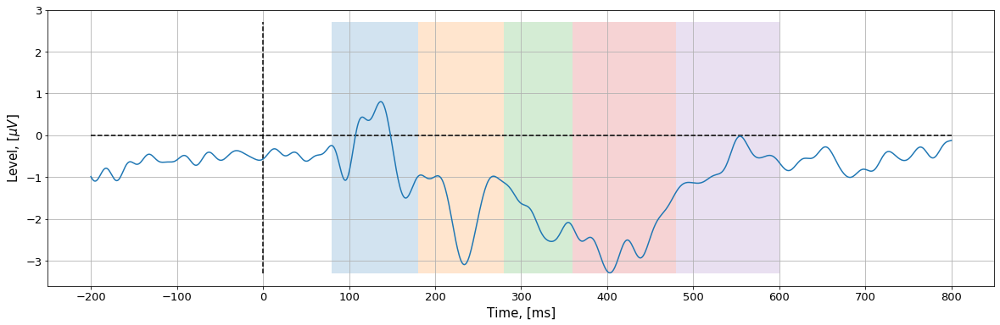

Files Loaded:  S01.edf.mrk S01.edf




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S02.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...

=== FILTER ===
Reading 0 ... 2357999  =      0.000 ...  2357.999 secs...

=== REJECT ===
Not setting metadata
2358 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 2358 events and 1001 original time points ...
1 bad epochs dropped

=== ICA ===
Estimating rejection dictionary for eeg
rejection threshold:  {'eeg': 9.887791949385617e-05}
Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-6-efa77eb1992e>:5: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject=reject_thr, tstep=1.0)


Selecting by explained variance: 22 components
Fitting ICA took 148.9s.

=== ARTIFACTS ===
Applying ICA to Raw instance
    Transforming to ICA space (22 components)
    Zeroing out 18 ICA components
    Projecting back using 49 PCA components

=== PLOT ===


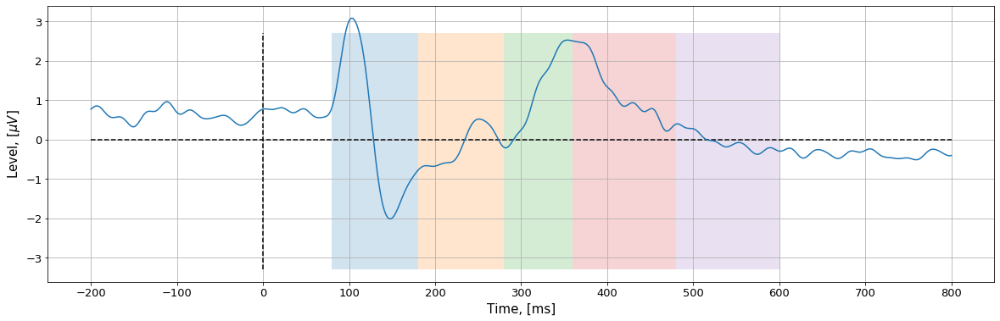

Files Loaded:  S02.edf.mrk S02.edf




In [ ]:
get_eeg_plot('./')

# **5. Functions Application** 

# **########################** 

# **3.0000** 

In [ ]:
file01 = './S01.edf'
file02 = './S02.edf'
file03 = './S03.edf'
file04 = './S04.edf'
file05 = './S05.edf'
file06 = './S06.edf'
file07 = './S07.edf'
file08 = './S08.edf'
file09 = './S09.edf'
file10 = './S10.edf'
file11 = './S11.edf'
file12 = './S12.edf'
file13 = './S13.edf'
file14 = './S14.edf'
file15 = './S15.edf'
file16 = './S16.edf'
file17 = './S17.edf'
file18 = './S18.edf'
file19 = './S19.edf'
file20 = './S20.edf'

In [ ]:
eeg01 = mne.io.read_raw_edf(file01)
eeg03 = mne.io.read_raw_edf(file03)
eeg17 = mne.io.read_raw_edf(file17)

Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S17.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [ ]:
# load data
file03 = './S03.edf'
eeg03 = mne.io.read_raw_edf(file03)

igt03 = pd.read_csv('S03.edf.mrk')

In [ ]:
eeg01

In [ ]:
n_time_samps = eeg01.n_times
time_secs = eeg01.times
ch_names = eeg01.ch_names

print('The last time sample is at {} seconds.'.format(time_secs[-1]))
print('The first few channel names are {}.'.format(', '.join(ch_names[:3])))
print()  # insert a blank line in the output

# some examples of raw.info:
print('bad channels:', eeg01.info['bads'])  # chs marked "bad" during acquisition
print(eeg01.info['sfreq'], 'Hz')            # sampling frequency
print(eeg01.info['description'], '\n')      # miscellaneous acquisition info

print(eeg01.info)

# **3.0 EEG data plotting** 

In [ ]:
eeg01_mod = eeg01.copy()
eeg01_mod.set_channel_types({'Fp1': 'eeg'})
print(eeg01_mod.copy().pick_types(eeg=True).ch_names)

eeg01_mod = eeg01.copy()
eeg01_mod.set_channel_types({'IO': 'eog'})
print(eeg01_mod.copy().pick_types(eog=True).ch_names)

In [ ]:
eeg01_mod

In [ ]:
builtin_montages = mne.channels.get_builtin_montages(descriptions=True)
for montage_name, montage_description in builtin_montages:
    print(f'{montage_name}: {montage_description}')

In [ ]:
easycap_montage = mne.channels.make_standard_montage('easycap-M1')
print(easycap_montage)

In [ ]:
easycap_montage.plot(sphere='eeglab')  # 2D
fig = easycap_montage.plot(kind='3d', show=False)  # 3D
fig = fig.gca().view_init(azim=120, elev=40)  # set view angle 

In [ ]:
sampling_freq = eeg01.info['sfreq']
start_stop_seconds = np.array([0, 100])
start_sample, stop_sample = (start_stop_seconds * sampling_freq).astype(int)

channel_index = 32
channel_names = ['IO']
raw_selection = eeg01[channel_index, start_sample:stop_sample]
print(raw_selection)
x = raw_selection[1]
y = raw_selection[0].T
plt.figure(figsize=(25, 5))
plt.plot(x, y)
plt.legend(channel_names)

In [ ]:
eeg01_mod.plot()

In [ ]:
eeg01_mod.drop_channels(['IO'])

In [ ]:
eeg01_mod.set_montage(easycap_montage)

In [ ]:
# Use the preloaded montage
eeg01_mod.set_montage(easycap_montage)
eeg01_mod.plot_sensors(sphere='eeglab', show_names=True)
eeg01_mod.plot_sensors(kind='3d', show=False, show_names=True).gca().view_init(azim=100, elev=20)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
!pip install pyvistaqt
import pyvistaqt

!pip install ipywidgets
import ipywidgets


# **4.0 ICA** 

In [ ]:
# Heartbeat artifacts (ECG)
# Ocular artifacts (EOG)

In [ ]:
# Here we'll crop to 60 seconds and drop gradiometer channels for speed

eeg01.crop(tmax=60.).pick_types(eeg=True, stim=True, eog=True, ecg=True)
eeg01.load_data()

In [ ]:
# pick some channels that clearly show heartbeats and blinks

regexp = file01
artifact_picks = mne.pick_channels_regexp(eeg01.ch_names, regexp=regexp)
artifact_picks

In [ ]:
eeg01.plot(order=artifact_picks, n_channels=len(artifact_picks), show_scrollbars=False)

In [ ]:
# ocular artifact manifests across each channel type

eog_evoked = create_eog_epochs(eeg01_mod).average()

In [ ]:
# heartbeat artifacts

ecg_evoked = create_ecg_epochs(eeg01_mod).average()
ecg_evoked.apply_baseline(baseline=(None, -0.2))
ecg_evoked.plot_joint()

In [ ]:
# Filtering to remove slow drifts

filt_eeg01 = eeg01.copy().filter(l_freq=1., h_freq=None)

In [ ]:
# Fitting ICA

ica = ICA(n_components=64, max_iter='auto', random_state=97)
ica.fit(filt_eeg01)
ica

In [ ]:
# Using get_explained_variance_ratio(), we can retrieve the fraction of variance 
# in the original data that is explained by our ICA components in the form of a dictionary:

explained_var_ratio = ica.get_explained_variance_ratio(filt_eeg01)
for channel_type, ratio in explained_var_ratio.items():
    print(
        f'Fraction of {channel_type} variance explained by all components: '
        f'{ratio}'
    )

In [ ]:
explained_var_ratio = ica.get_explained_variance_ratio(
    filt_eeg01,
    components=[0],
    ch_type='eeg'
)
# This time, print as percentage.
ratio_percent = round(100 * explained_var_ratio['eeg'])
print(
    f'Fraction of variance in EEG signal explained by first component: '
    f'{ratio_percent}%'
)

In [ ]:
eeg01.load_data()
ica.plot_sources(eeg01, show_scrollbars=False)

In [ ]:
ica.plot_components()

In [ ]:
# blinks
ica.plot_overlay(eeg01, exclude=[0], picks='eeg')

# heartbeats
ica.plot_overlay(eeg01, exclude=[1], picks='eeg')

In [ ]:
ica.plot_properties(eeg01, picks=[0, 1])

In [ ]:
# Selecting ICA components manually

ica.exclude = [0, 1]  # indices chosen based on various plots above

In [ ]:
# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = eeg01.copy()
ica.apply(reconst_raw)

eeg01.plot(show_scrollbars=False)
reconst_raw.plot(show_scrollbars=False)
del reconst_raw

In [ ]:
biosemi_montage = mne.channels.make_standard_montage('biosemi64')
biosemi_montage.plot(sphere=(0, 0, 0.035, 0.094))

fig = biosemi_montage.plot(kind='3d', scale_factor=2, show=True)
fig.gca().view_init(azim=70, elev=10)  # set view angle

In [ ]:
# Using an EOG channel to select ICA components

ica.exclude = []
# find which ICs match the EOG pattern
eog_indices, eog_scores = ica.find_bads_eog(eeg01, ch_name='Fpz')

ica.exclude = eog_indices

# barplot of ICA component "EOG match" scores
ica.plot_scores(eog_scores)

# plot ICs applied to raw data, with EOG matches highlighted
ica.plot_sources(eeg01, show_scrollbars=False)

In [ ]:
# Using an ECG channel to select ICA components

ica.exclude = []
# find which ICs match the ECG pattern
ecg_indices, ecg_scores = ica.find_bads_ecg(eeg01, method='correlation',
                                            threshold='auto',
                                            ch_name='Oz')
ica.exclude = ecg_indices

# barplot of ICA component "ECG match" scores
ica.plot_scores(ecg_scores)

# plot ICs applied to raw data, with ECG matches highlighted
ica.plot_sources(eeg01, show_scrollbars=False)

In [ ]:
eeg01.set_montage(montage=DigMontage, on_missing='raise')

In [ ]:
# find muscle components

muscle_idx_auto, scores = ica.find_bads_muscle(eeg01_mod, sphere='eeglab')
ica.plot_scores(scores, exclude=muscle_idx_auto)
print(f'Manually found muscle artifact ICA components:      {muscle_idx}\n'
      f'Automatically found muscle artifact ICA components: {muscle_idx_auto}')

In [ ]:
muscle_idx = [5,7,8,10,11,12,13,18]

# first, remove blinks and heartbeat to compare
blink_idx = [0]
heartbeat_idx = [14,16,34]

ica.apply(eeg01, exclude=blink_idx + heartbeat_idx)
ica.plot_overlay(eeg01, exclude=muscle_idx)

# **5.0 ICA application** 

# **5.1 eeg17 dataset** 

In [ ]:
n_time_samps = eeg17.n_times
time_secs = eeg17.times
ch_names = eeg17.ch_names

print('The last time sample is at {} seconds.'.format(time_secs[-1]))
print('The first few channel names are {}.'.format(', '.join(ch_names[:3])))
print()  # insert a blank line in the output

# some examples of raw.info:
print('bad channels:', eeg17.info['bads'])  # chs marked "bad" during acquisition
print(eeg17.info['sfreq'], 'Hz')            # sampling frequency
print(eeg17.info['description'], '\n')      # miscellaneous acquisition info

print(eeg17.info)

In [ ]:
eeg17.ch_names

In [ ]:
eeg17.plot()

In [ ]:
igt01 = pd.read_csv('S01.edf.mrk')
igt03 = pd.read_csv('S03.edf.mrk')
igt17 = pd.read_csv('S17.edf.mrk')

In [ ]:
def EVENTS(a):
    a = a.TL02.str.split(r'\t', expand=True) # dividing by columns; !!!the whole dataset is more than 200 trials (201)!!!
    a.columns = ['Time', 'Time1', 'Mark'] # rename columns
    a.drop('Time1', axis = 1, inplace = True) # drop colunm "0"

    # Sort decision time points (DTP) only and dividing by 10 Blocks
    igt1 = a[(a.Mark == '"PP 1"') | (a.Mark == '"PP 2"') | (a.Mark == '"PP 3"') | (a.Mark == '"PP 4"')]
    igt1.columns = ['DTP', 'Deck']
    igt1 = igt1.reset_index(drop = True)
    igt1['Block'] = pd.DataFrame(np.repeat(np.arange(0, 10), 20))
    
    # Sort reaction time points (RTP)
    # PP9 - win
    # PP10 - loss
    igt2 = a[(a.Mark == '"PP 9"') | (a.Mark == '"PP 10"')]
    igt2.columns = ['RTP', 'Result']
    igt2 = igt2.reset_index(drop = True)

    # The whole IGT dataset
    igt = igt1.join(igt2)
    igt = igt.dropna(axis=0, how='any') # erasing NaN rows
    igt = igt.drop_duplicates(keep='first', subset='RTP') # duplicates in rows deliting

    # Rename decks and results
    igt['RTP'] = igt['RTP'].astype(str).astype(int)
    igt['DTP'] = igt['DTP'].astype(str).astype(int)
    igt.loc[(igt.Deck == '"PP 1"'), 'Deck'] = 'A'
    igt.loc[(igt.Deck == '"PP 2"'), 'Deck'] = 'B'
    igt.loc[(igt.Deck == '"PP 3"'), 'Deck'] = 'C' 
    igt.loc[(igt.Deck == '"PP 4"'), 'Deck'] = 'D'
    igt.loc[(igt.Result == '"PP 9"'), 'Result'] = '1' 
    igt.loc[(igt.Result == '"PP 10"'), 'Result'] = '0'
    
    # Events (triggers) list creation
    igt['Tmax'] = igt['RTP'] + 800 # RTP is 0 point of trigger event, Tmax is the END point of the trigger event
    igt['Tmin'] = igt['RTP'] - 200 # RTP is 0 point of trigger event, Tmin is the START point of the trigger event
    events = igt[['Deck', 'Tmin', 'Tmax']]
    events = events.melt(id_vars=['Deck'], value_vars=['Tmin', 'Tmax'])
    events.drop('Deck', axis = 1, inplace = True)
    events.columns = ['point', 'time']
    events = events.sort_values(by=['time'])
    
    Tmin = events[(events.point == 'Tmin')]
    Tmax = events[(events.point == 'Tmax')]
    Tmax = Tmax.reset_index(drop = True)
    Tmin['index'] = pd.DataFrame(np.arange(1001, 2001))
    Tmax['index'] = pd.DataFrame(np.arange(2001, 3001))
    events = pd.concat([Tmin, Tmax])
    events = events.reset_index(drop = True)
    events = events.sort_values(by=['time'])   
    # For following synchronization with EEG dataset EVENTS data should be adjusted by adding an appropriate columns
    
    # Set of triggers events (time window intervals) creation: 200 card selections by 1001 time points, total 200200 rows     
    intervals = pd.concat([pd.DataFrame([i], columns=['point']) for i in range(1001)]*200, ignore_index=True)
    intervals.loc[intervals.point == 0, 'point'] = '01Tmin'
    intervals.loc[intervals.point == 1000, 'point'] = '02Tmax'
    intervals['int'] = pd.DataFrame(np.arange(0, 200200)) 
    
    # Rename Tmin and Tmax points for following sorting
    intervals['point'] = intervals['point'].astype(str)
    
    # now we have the first 200 rows of Tmin (01Tmin) and the second 200 rows of Tmax (02Tmax) 
    # for following numbering simplification
    intervals = intervals.sort_values(by=['point', 'int'])
    intervals = intervals.reset_index(drop = True)
    
    # Adding new column "index" for numbering Tmin and Tmax
    A = [np.arange(1001, 1201)]
    B = [np.arange(2001, 2201)]
    AA = pd.DataFrame(A).T
    BB = pd.DataFrame(B).T
    C = pd.concat([AA, BB])
    C = C.reset_index(drop = True)
    intervals = intervals.join(C)
    intervals.columns = ['point', 'int', 'index']
    intervals = intervals.fillna(0)
    # Now we have individual indexes for each Tmin and Tmax
    
    # Sort back to 1 - 200200 by "int" column
    intervals = intervals.sort_values(by=['int'])
    intervals['index'] = intervals['index'].astype(int)
    
    # Rename points back
    intervals.loc[(intervals.point == '01Tmin'), 'point'] = 'Tmin' 
    intervals.loc[(intervals.point == '02Tmax'), 'point'] = 'Tmax'
    
     # Creation trigger events dataset
    
    events_triggers = intervals.merge(events, how = 'left', on = 'index') # merge EVENTS and INTERVALS
    
    events_triggers = events_triggers.reset_index(drop = True)
    events_triggers = events_triggers[['point_x', 'time']] # taking just two columns
    events_triggers.columns = ['intervals', 'time'] # renaming columns to "INTARVALS" and "TIME"

    events_triggers['time3'] = events_triggers['time']
    events_triggers['time3'].fillna(method='bfill', inplace=True) # filling NaN as the lower  number

    events_triggers = events_triggers.dropna(subset=['time3'])# drop NaN by the column

    events_triggers['time4'] = events_triggers['time']

    events_triggers = events_triggers.fillna(method='ffill') # filling NaN as the upper number

    events_triggers['intervals2'] = events_triggers['intervals']
    events_triggers.loc[(events_triggers.intervals2 == 'Tmin'), 'intervals2'] = '0' 
    events_triggers.loc[(events_triggers.intervals2 == 'Tmax'), 'intervals2'] = '0' 
    events_triggers['intervals2'] = events_triggers['intervals2'].astype(int)

    events_triggers['time5'] = events_triggers['time4'] + events_triggers['intervals2']
    events_triggers = events_triggers[['intervals', 'time5']]
    events_triggers.columns = ['intervals', 'time']
 
    return events_triggers

In [ ]:
 def EEG(eeg_data, igt_trigger):    
    # The whole dataset creation connecting trigger events with eeg levels by time points
    S = eeg_data.join(igt_trigger.set_index('time'), on='time')
    S = S.dropna(axis=0, how='any') # erasing NaN rows
    S = S.reset_index(drop = True)
    
    # preparing dataset for following PIVOT function application
    # adding 'EPOCHS' column that reflects 200 epochs (each for each card choice) with 1001 time points
    S['epochs'] = pd.DataFrame(np.repeat(np.arange(0, 200), 1001))
    S.loc[(S.intervals == 'Tmin'), 'intervals'] = '0' 
    S.loc[(S.intervals == 'Tmax'), 'intervals'] = '1000' 
    S['intervals'] = S['intervals'].astype(int)

    # Dataset transformation, matching (Tmin, -199, -198, ..., -1, RTP(0), 1, 2,3, ....., 788, 789, Tmax) points
    S = S.pivot(index='epochs', columns='intervals', values='level')
    S = S.reset_index(drop = True)
    S_T = S.T
    S_T = S_T.reset_index(drop = True)
    S_T_T = S_T.T
    S_T_T = S_T_T.reset_index(drop = True)
    S_T_T_T = S_T_T.T
    
    return S_T_T_T

In [ ]:
Events01 = EVENTS(igt01)
Events03 = EVENTS(igt03)
Events17 = EVENTS(igt17)

In [ ]:
def EEG_Filter(eeg_data):                   
    raw_df = eeg_data.to_data_frame()
    
    sfreq = eeg_data.info['sfreq'] # frequency setting: 1000Hz
    eeg_data.load_data()

    # Filtering: low-pass 1Hz, High-pass 43Hz
    raw_f = eeg_data.notch_filter(50)  # notch filter 50 Hz
    raw_f = eeg_data.filter(1., 100., fir_design='firwin', skip_by_annotation='edge') # FIR filter
    raw_df_f = raw_f.to_data_frame()
    raw_df_f.drop('time', axis = 1, inplace = True)
                         
    mask = ((raw_df <= 50) & (raw_df >= -50)) # removing data below -50uV and above 50uV
    raw_df_f = raw_df_f[mask]
    raw_df_f = raw_df_f.fillna(method='ffill')
    raw_df_f = raw_df_f.fillna(method='bfill')
                                            
    # Signal averaging by channels
    raw_df_f['level'] = raw_df_f.mean(axis=1)
    raw_df_f_mean = raw_df_f['level']
    raw_df_f_mean = raw_df_f_mean.to_frame()
    raw_df_f_mean['time'] = raw_df_f_mean.index
    
    return raw_df_f_mean

In [ ]:
eeg01 = EEG_Filter(mne.io.read_raw_edf('./S01.edf'))
eeg03 = EEG_Filter(mne.io.read_raw_edf('./S03.edf'))
eeg17 = EEG_Filter(mne.io.read_raw_edf('./S17.edf'))

In [ ]:
def EEG_PLOT(a):
  a_mean = a.to_frame()
  a_mean['Time'] = pd.DataFrame(np.arange(-200, 801))
  a_mean.columns = ['Level', 'Time']

  plt.figure(figsize=(20, 6))
  
  plt.plot(a_mean['Time'], a_mean['Level'])

  plt.hlines(0, -200, 800, colors='black', linestyles='dashed')
  plt.vlines(0, -3.3, 1.7, colors='black', linestyles='dashed')
  plt.grid()
  plt.xlabel('Time, [ms]', size='15')
  plt.ylabel('Level, [$\mu V$]', size='15')
  y = np.arange(-3.3, 2.3)
  plt.fill_betweenx(y,  80, 180, alpha=0.2)
  plt.fill_betweenx(y, 180, 280, alpha=0.2)
  plt.fill_betweenx(y, 280, 360, alpha=0.2)
  plt.fill_betweenx(y, 360, 480, alpha=0.2)
  plt.fill_betweenx(y, 480, 600, alpha=0.2)
  plt.yticks(fontsize=13)
  plt.xticks(np.arange(-200, 801, step=100), fontsize=13)

  plt.show()

  return a_mean

In [ ]:
# Combining 20 EEG datasets in one. Averaging
def TOTAL(a):
    a_mean = a.mean(axis=1)
    
    
    return a_mean

In [ ]:
EEG01 = EEG(eeg01, Events01)
EEG03 = EEG(eeg03, Events03)
EEG17 = EEG(eeg17, Events17)

In [ ]:
EEG01_avg = TOTAL(EEG01)
EEG03_avg = TOTAL(EEG03)
EEG17_avg = TOTAL(EEG17)

In [ ]:
Plot_EEG01 = EEG_PLOT(EEG01_avg)
Plot_EEG03 = EEG_PLOT(EEG03_avg)
Plot_EEG17 = EEG_PLOT(EEG17_avg)

In [ ]:
eeg01 = mne.io.read_raw_edf(file01)
eeg03 = mne.io.read_raw_edf(file03)
eeg17 = mne.io.read_raw_edf(file17)

In [ ]:
eeg17.load_data()
eeg17_filt = eeg17.copy().filter(l_freq=1., h_freq=None)

In [ ]:
ica = ICA(n_components=64, max_iter='auto', random_state=97, method='fastica')
eeg_17_filt_ica = ica.fit(eeg17_filt)
eeg_17_filt_ica

In [ ]:
eeg_17_filt_ica.plot_sources(eeg17, show_scrollbars=False)

In [ ]:
# blinks
eeg_17_filt_ica.plot_overlay(eeg17, exclude=[0], picks='eeg')

In [ ]:
eeg_17_filt_ica.exclude = [0]

In [ ]:
# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = eeg17.copy()
eeg_17_filt_ica.apply(reconst_raw)

eeg17.plot(show_scrollbars=False)
reconst_raw.plot(show_scrollbars=False)
del reconst_raw

In [ ]:
eeg_17_filt_ica.exclude = []
# find which ICs match the EOG pattern
eog_indices, eog_scores = eeg_17_filt_ica.find_bads_eog(eeg17, ch_name='IO')
eeg_17_filt_ica.exclude = eog_indices

# barplot of ICA component "EOG match" scores
eeg_17_filt_ica.plot_scores(eog_scores)

# plot ICs applied to raw data, with EOG matches highlighted
eeg_17_filt_ica.plot_sources(eeg17, show_scrollbars=False)

In [ ]:
eeg_17_filt_ica.exclude = []
# find which ICs match the ECG pattern
ecg_indices, ecg_scores = eeg_17_filt_ica.find_bads_ecg(eeg17, method='correlation',
                                            threshold='auto',
                                            ch_name='IO')
eeg_17_filt_ica.exclude = ecg_indices

# barplot of ICA component "ECG match" scores
eeg_17_filt_ica.plot_scores(ecg_scores)

# plot ICs applied to raw data, with ECG matches highlighted
eeg_17_filt_ica.plot_sources(eeg17, show_scrollbars=False)

# **5.2 eeg03 dataset** 

In [ ]:
eeg03.load_data()
eeg03_filt = eeg03.copy().filter(l_freq=1., h_freq=None)

ica03 = ICA(n_components=20, max_iter='auto', random_state=97, method='fastica')
eeg03_ica = ica03.fit(eeg03_filt)
eeg03_ica

Reading 0 ... 1855999  =      0.000 ...  1855.999 secs...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    5.9s finished


Fitting ICA to data using 64 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 68.1s.


Method,fastica
Fit,26 iterations on raw data (1856000 samples)
ICA components,20
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=20, n_times=1856000
    Range : 0 ... 1855999 =      0.000 ...  1855.999 secs
Ready.


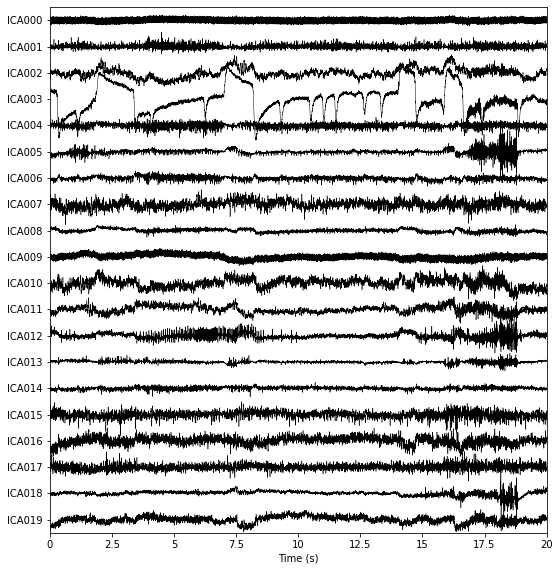

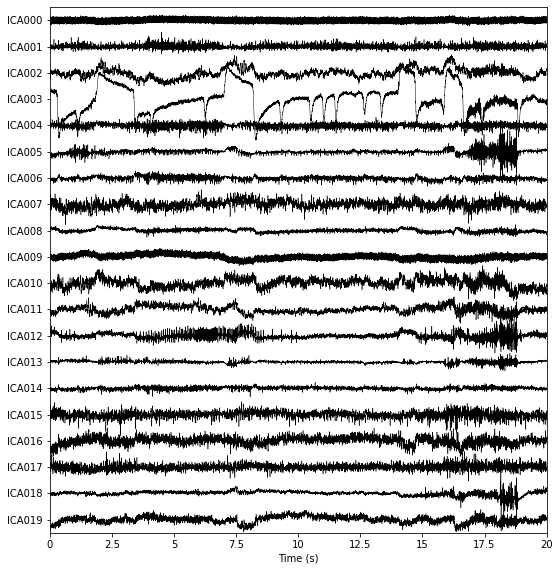

In [ ]:
eeg03_ica.plot_sources(eeg03, show_scrollbars=False)

In [ ]:
eeg03_mod = eeg03.copy()



In [ ]:
eeg03_mod.set_channel_types({'Fp1': 'eeg'})
print(eeg03_mod.copy().pick_types(eeg=True).ch_names)

eeg03_mod = eeg03.copy()
eeg03_mod.set_channel_types({'IO': 'eog'})
print(eeg03_mod.copy().pick_types(eog=True).ch_names)

eeg03_mod.set_montage(easycap_montage)

['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT9', 'FC5', 'FC1', 'FC2', 'FC6', 'FT10', 'T7', 'C3', 'Cz', 'C4', 'T8', 'TP9', 'CP5', 'CP1', 'CP2', 'CP6', 'TP10', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2', 'IO', 'Fpz', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FT7', 'FC3', 'FC4', 'FT8', 'C5', 'C1', 'C2', 'C6', 'TP7', 'CP3', 'CPz', 'CP4', 'TP8', 'P5', 'P1', 'P2', 'P6', 'PO7', 'PO3', 'POz', 'PO4', 'PO8', 'Oz']
['IO']


<RawEDF | S03.edf, 64 x 1856000 (1856.0 s), ~906.3 MB, data loaded>

In [ ]:
eeg03_mod.load_data()
eeg03_mod_filt = eeg03_mod.copy().filter(l_freq=1., h_freq=None)

ica03_mod = ICA(n_components=20, max_iter='auto', random_state=97, method='fastica')
eeg03_mod_ica = ica03_mod.fit(eeg03_mod_filt)
eeg03_mod_ica

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    6.1s finished


Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 95.4s.


Method,fastica
Fit,42 iterations on raw data (1856000 samples)
ICA components,20
Available PCA components,63
Channel types,eeg
ICA components marked for exclusion,—


Effective window size : 0.256 (s)


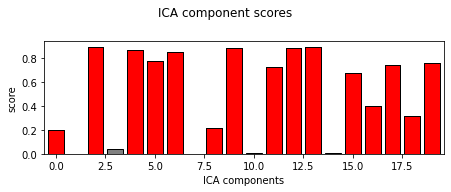

Automatically found muscle artifact ICA components: [0, 2, 4, 5, 6, 8, 9, 11, 12, 13, 15, 16, 17, 18, 19]


In [ ]:
muscle_idx_auto, scores = ica03_mod.find_bads_muscle(eeg03_mod)
ica03_mod.plot_scores(scores, exclude=muscle_idx_auto)
print(f'Automatically found muscle artifact ICA components: {muscle_idx_auto}')

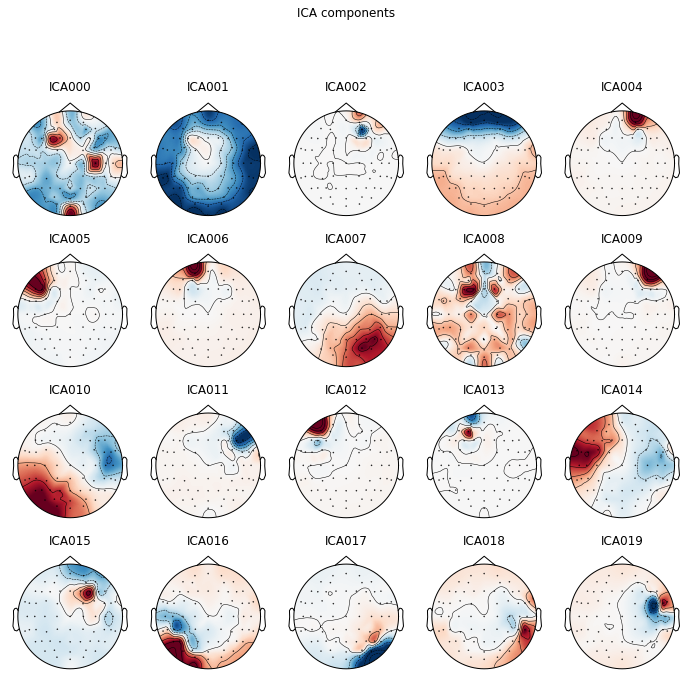

[<MNEFigure size 702x696.24 with 20 Axes>]

In [ ]:
ica03_mod.plot_components()

Using EOG channel: IO
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.6s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


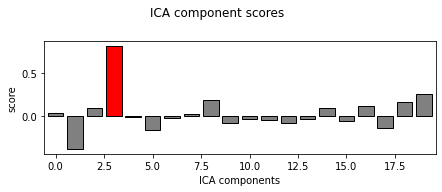

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
928 matching events found
No baseline correction applied
0 projection items activated


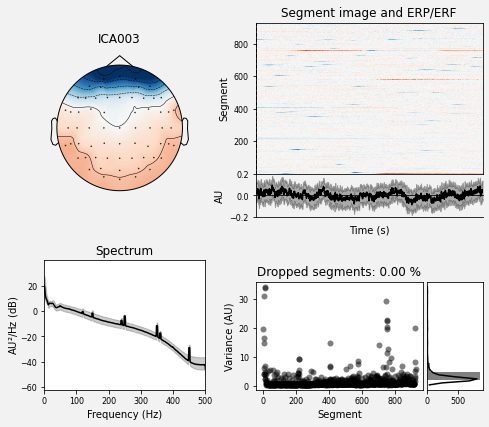

Creating RawArray with float64 data, n_channels=21, n_times=1856000
    Range : 0 ... 1855999 =      0.000 ...  1855.999 secs
Ready.


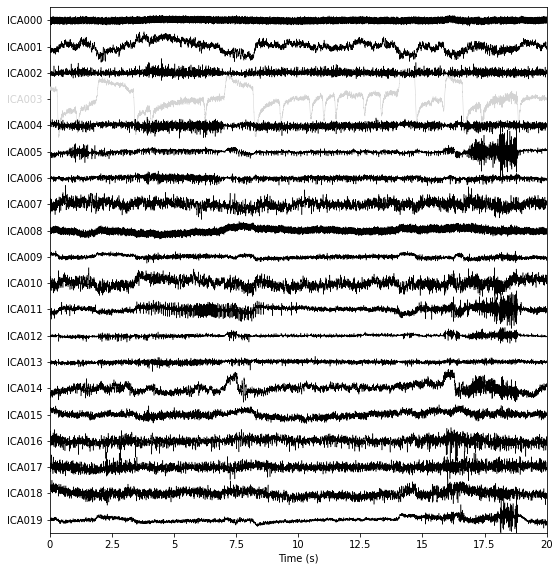

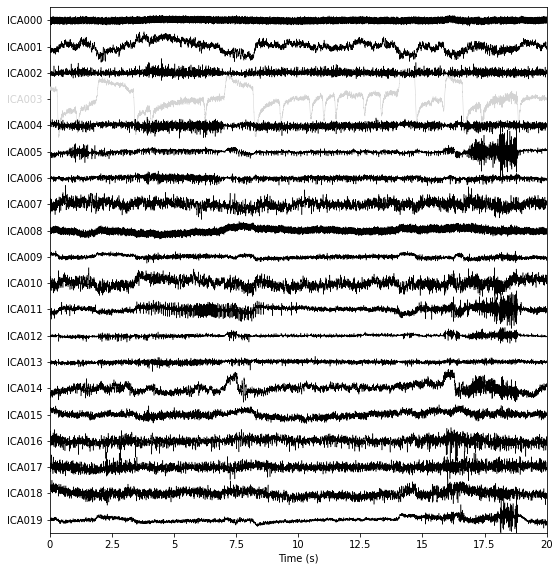

In [ ]:
ica03_mod.exclude = []
# find which ICs match the EOG pattern
eog_indices, eog_scores = ica03_mod.find_bads_eog(eeg03_mod)
ica03_mod.exclude = eog_indices

# barplot of ICA component "EOG match" scores
ica03_mod.plot_scores(eog_scores)

# plot diagnostics
ica03_mod.plot_properties(eeg03_mod, picks=eog_indices)

# plot ICs applied to raw data, with EOG matches highlighted
ica03_mod.plot_sources(eeg03_mod, show_scrollbars=False)

In [ ]:
FT9', 'FT7', 'T7', 'TP7', 'TP9', 'FC5', 'CP5', 'FT10', 'FT8', 'T8', 'TP8', 'TP10', 'FC6', 'CP6'

In [ ]:
ica_z_thresh = 1.96

ica03_mod.exclude = []
# find which ICs match the ECG pattern
ecg_indices, ecg_scores = ica03_mod.find_bads_ecg(eeg03_mod, method='correlation', threshold='auto', ch_name='Cz')
eeg03_mod.exclude = ecg_indices

# barplot of ICA component "ECG match" scores
ica03_mod.plot_scores(ecg_scores)

# plot diagnostics
ica03_mod.plot_properties(eeg03_mod, picks=ecg_indices)

# plot ICs applied to raw data, with ECG matches highlighted
ica03_mod.plot_sources(eeg03_mod, show_scrollbars=False)

In [ ]:
# Break raw data into 1 s epochs
tstep = 1.0
events_ica = mne.make_fixed_length_events(raw_ica, duration=tstep)
epochs_ica = mne.Epochs(raw_ica, events_ica,
                        tmin=0.0, tmax=tstep,
                        baseline=None,
                        preload=True)

In [ ]:
reject = get_rejection_threshold(epochs_ica);
reject

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 17 ICA components
    Projecting back using 63 PCA components


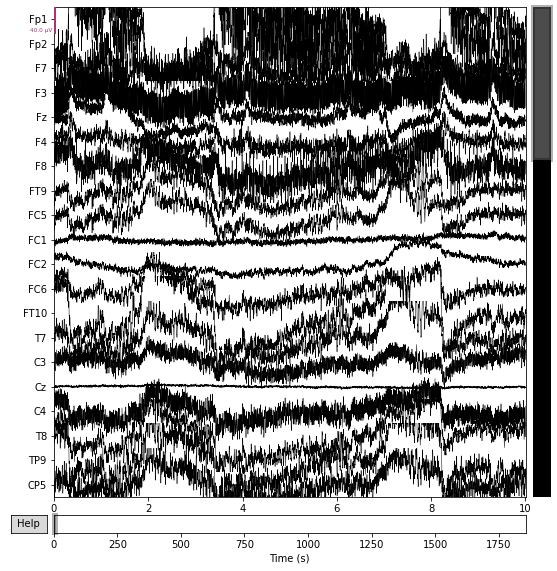

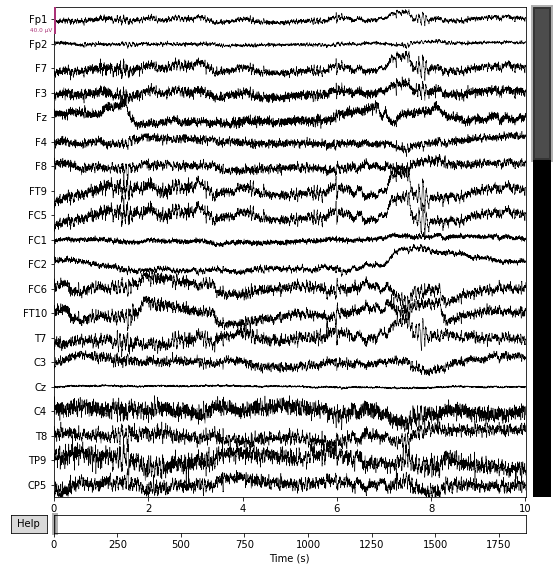

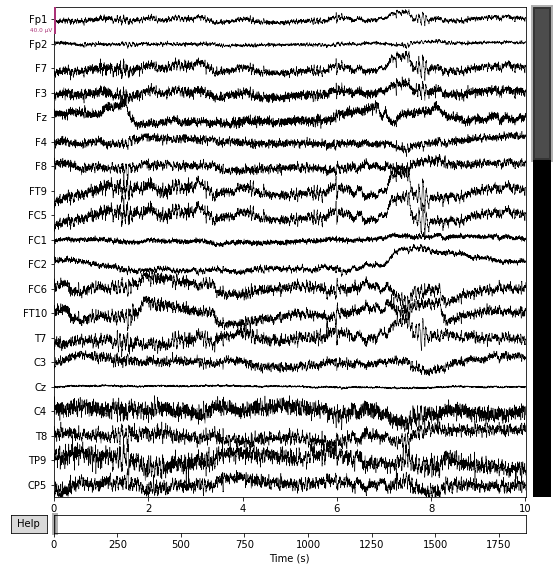

In [ ]:
eog_ind = eog_indices
ecg_ind = [1]
musc_ind = muscle_idx_auto

ica03_mod_eeg = ica03_mod.apply(eeg03_mod, exclude = eog_ind + ecg_ind + musc_ind)
eeg03.plot()
ica03_mod_eeg.plot()

In [ ]:
    raw_df_f = ica03_mod_eeg.to_data_frame()
    raw_df_f.drop('time', axis = 1, inplace = True)
                                            
    # Signal averaging by channels
    raw_df_f['level'] = raw_df_f.mean(axis=1)
    raw_df_f_mean = raw_df_f['level']
    raw_df_f_mean = raw_df_f_mean.to_frame()
    raw_df_f_mean['time'] = raw_df_f_mean.index
    
    eeg03_ica_mod = raw_df_f_mean

In [ ]:
EEG03 = EEG(eeg03_ica_mod, Events03)

In [ ]:
EEG03_avg = TOTAL(EEG03)

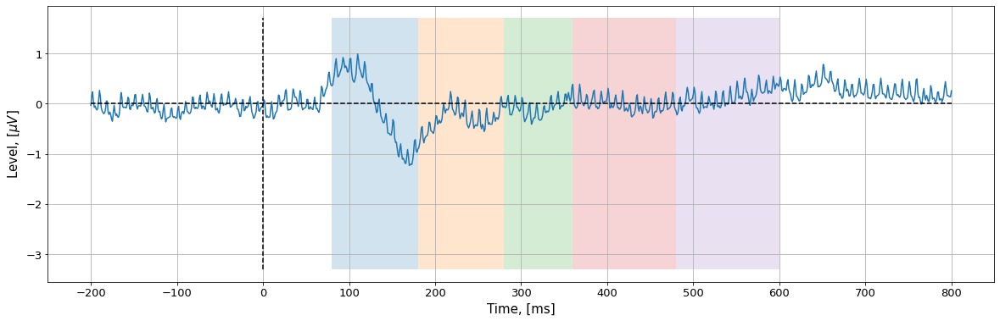

In [ ]:
Plot_EEG03 = EEG_PLOT(EEG03_avg)

# **5.3.1 ICA function** 

In [ ]:
# load data
file03 = './S03.edf'
eeg03 = mne.io.read_raw_edf(file03)

igt03 = pd.read_csv('S03.edf.mrk')


Extracting EDF parameters from /content/drive/MyDrive/EEG-IGT Experiment Data/S03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [ ]:
builtin_montages = mne.channels.get_builtin_montages(descriptions=True)
for montage_name, montage_description in builtin_montages:
    print(f'{montage_name}: {montage_description}')

standard_1005: Electrodes are named and positioned according to the international 10-05 system (343+3 locations)
standard_1020: Electrodes are named and positioned according to the international 10-20 system (94+3 locations)
standard_alphabetic: Electrodes are named with LETTER-NUMBER combinations (A1, B2, F4, …) (65+3 locations)
standard_postfixed: Electrodes are named according to the international 10-20 system using postfixes for intermediate positions (100+3 locations)
standard_prefixed: Electrodes are named according to the international 10-20 system using prefixes for intermediate positions (74+3 locations)
standard_primed: Electrodes are named according to the international 10-20 system using prime marks (' and '') for intermediate positions (100+3 locations)
biosemi16: BioSemi cap with 16 electrodes (16+3 locations)
biosemi32: BioSemi cap with 32 electrodes (32+3 locations)
biosemi64: BioSemi cap with 64 electrodes (64+3 locations)
biosemi128: BioSemi cap with 128 electrodes (1

In [ ]:
easycap_montage = mne.channels.make_standard_montage('easycap-M1')
print(easycap_montage)

<DigMontage | 0 extras (headshape), 0 HPIs, 3 fiducials, 74 channels>


In [ ]:
def EVENTS(a):
    a = a.TL02.str.split(r'\t', expand=True) # dividing by columns; !!!the whole dataset is more than 200 trials (201)!!!
    a.columns = ['Time', 'Time1', 'Mark'] # rename columns
    a.drop('Time1', axis = 1, inplace = True) # drop colunm "0"

    # Sort decision time points (DTP) only and dividing by 10 Blocks
    igt1 = a[(a.Mark == '"PP 1"') | (a.Mark == '"PP 2"') | (a.Mark == '"PP 3"') | (a.Mark == '"PP 4"')]
    igt1.columns = ['DTP', 'Deck']
    igt1 = igt1.reset_index(drop = True)
    igt1['Block'] = pd.DataFrame(np.repeat(np.arange(0, 10), 20))
    
    # Sort reaction time points (RTP)
    # PP9 - win
    # PP10 - loss
    igt2 = a[(a.Mark == '"PP 9"') | (a.Mark == '"PP 10"')]
    igt2.columns = ['RTP', 'Result']
    igt2 = igt2.reset_index(drop = True)

    # The whole IGT dataset
    igt = igt1.join(igt2)
    igt = igt.dropna(axis=0, how='any') # erasing NaN rows
    igt = igt.drop_duplicates(keep='first', subset='RTP') # duplicates in rows deliting

    # Rename decks and results
    igt['RTP'] = igt['RTP'].astype(str).astype(int)
    igt['DTP'] = igt['DTP'].astype(str).astype(int)
    igt.loc[(igt.Deck == '"PP 1"'), 'Deck'] = 'A'
    igt.loc[(igt.Deck == '"PP 2"'), 'Deck'] = 'B'
    igt.loc[(igt.Deck == '"PP 3"'), 'Deck'] = 'C' 
    igt.loc[(igt.Deck == '"PP 4"'), 'Deck'] = 'D'
    igt.loc[(igt.Result == '"PP 9"'), 'Result'] = '1' 
    igt.loc[(igt.Result == '"PP 10"'), 'Result'] = '0'
    
    # Events (triggers) list creation
    igt['Tmax'] = igt['RTP'] + 800 # RTP is 0 point of trigger event, Tmax is the END point of the trigger event
    igt['Tmin'] = igt['RTP'] - 200 # RTP is 0 point of trigger event, Tmin is the START point of the trigger event
    events = igt[['Deck', 'Tmin', 'Tmax']]
    events = events.melt(id_vars=['Deck'], value_vars=['Tmin', 'Tmax'])
    events.drop('Deck', axis = 1, inplace = True)
    events.columns = ['point', 'time']
    events = events.sort_values(by=['time'])
    
    Tmin = events[(events.point == 'Tmin')]
    Tmax = events[(events.point == 'Tmax')]
    Tmax = Tmax.reset_index(drop = True)
    Tmin['index'] = pd.DataFrame(np.arange(1001, 2001))
    Tmax['index'] = pd.DataFrame(np.arange(2001, 3001))
    events = pd.concat([Tmin, Tmax])
    events = events.reset_index(drop = True)
    events = events.sort_values(by=['time'])   
    # For following synchronization with EEG dataset EVENTS data should be adjusted by adding an appropriate columns
    
    # Set of triggers events (time window intervals) creation: 200 card selections by 1001 time points, total 200200 rows     
    intervals = pd.concat([pd.DataFrame([i], columns=['point']) for i in range(1001)]*200, ignore_index=True)
    intervals.loc[intervals.point == 0, 'point'] = '01Tmin'
    intervals.loc[intervals.point == 1000, 'point'] = '02Tmax'
    intervals['int'] = pd.DataFrame(np.arange(0, 200200)) 
    
    # Rename Tmin and Tmax points for following sorting
    intervals['point'] = intervals['point'].astype(str)
    
    # now we have the first 200 rows of Tmin (01Tmin) and the second 200 rows of Tmax (02Tmax) 
    # for following numbering simplification
    intervals = intervals.sort_values(by=['point', 'int'])
    intervals = intervals.reset_index(drop = True)
    
    # Adding new column "index" for numbering Tmin and Tmax
    A = [np.arange(1001, 1201)]
    B = [np.arange(2001, 2201)]
    AA = pd.DataFrame(A).T
    BB = pd.DataFrame(B).T
    C = pd.concat([AA, BB])
    C = C.reset_index(drop = True)
    intervals = intervals.join(C)
    intervals.columns = ['point', 'int', 'index']
    intervals = intervals.fillna(0)
    # Now we have individual indexes for each Tmin and Tmax
    
    # Sort back to 1 - 200200 by "int" column
    intervals = intervals.sort_values(by=['int'])
    intervals['index'] = intervals['index'].astype(int)
    
    # Rename points back
    intervals.loc[(intervals.point == '01Tmin'), 'point'] = 'Tmin' 
    intervals.loc[(intervals.point == '02Tmax'), 'point'] = 'Tmax'
    
     # Creation trigger events dataset
    
    events_triggers = intervals.merge(events, how = 'left', on = 'index') # merge EVENTS and INTERVALS
    
    events_triggers = events_triggers.reset_index(drop = True)
    events_triggers = events_triggers[['point_x', 'time']] # taking just two columns
    events_triggers.columns = ['intervals', 'time'] # renaming columns to "INTARVALS" and "TIME"

    events_triggers['time3'] = events_triggers['time']
    events_triggers['time3'].fillna(method='bfill', inplace=True) # filling NaN as the lower  number

    events_triggers = events_triggers.dropna(subset=['time3'])# drop NaN by the column

    events_triggers['time4'] = events_triggers['time']

    events_triggers = events_triggers.fillna(method='ffill') # filling NaN as the upper number

    events_triggers['intervals2'] = events_triggers['intervals']
    events_triggers.loc[(events_triggers.intervals2 == 'Tmin'), 'intervals2'] = '0' 
    events_triggers.loc[(events_triggers.intervals2 == 'Tmax'), 'intervals2'] = '0' 
    events_triggers['intervals2'] = events_triggers['intervals2'].astype(int)

    events_triggers['time5'] = events_triggers['time4'] + events_triggers['intervals2']
    events_triggers = events_triggers[['intervals', 'time5']]
    events_triggers.columns = ['intervals', 'time']
 
    return events_triggers

In [ ]:
 def EEG(eeg_data, igt_trigger):    
    # The whole dataset creation connecting trigger events with eeg levels by time points
    S = eeg_data.join(igt_trigger.set_index('time'), on='time')
    S = S.dropna(axis=0, how='any') # erasing NaN rows
    S = S.reset_index(drop = True)
    
    # preparing dataset for following PIVOT function application
    # adding 'EPOCHS' column that reflects 200 epochs (each for each card choice) with 1001 time points
    S['epochs'] = pd.DataFrame(np.repeat(np.arange(0, 200), 1001))
    S.loc[(S.intervals == 'Tmin'), 'intervals'] = '0' 
    S.loc[(S.intervals == 'Tmax'), 'intervals'] = '1000' 
    S['intervals'] = S['intervals'].astype(int)

    # Dataset transformation, matching (Tmin, -199, -198, ..., -1, RTP(0), 1, 2,3, ....., 788, 789, Tmax) points
    S = S.pivot(index='epochs', columns='intervals', values='level')
    S = S.reset_index(drop = True)
    S_T = S.T
    S_T = S_T.reset_index(drop = True)
    S_T_T = S_T.T
    S_T_T = S_T_T.reset_index(drop = True)
    S_T_T_T = S_T_T.T
    
    return S_T_T_T

In [ ]:
def EEG_PLOT(a):
  a_mean = a.to_frame()
  a_mean['Time'] = pd.DataFrame(np.arange(-200, 801))
  a_mean.columns = ['Level', 'Time']

  plt.figure(figsize=(20, 6))
  
  plt.plot(a_mean['Time'], a_mean['Level'])

  plt.hlines(0, -200, 800, colors='black', linestyles='dashed')
  plt.vlines(0, -3.3, 1.7, colors='black', linestyles='dashed')
  plt.grid()
  plt.xlabel('Time, [ms]', size='15')
  plt.ylabel('Level, [$\mu V$]', size='15')
  y = np.arange(-3.3, 2.3)
  plt.fill_betweenx(y,  80, 180, alpha=0.2)
  plt.fill_betweenx(y, 180, 280, alpha=0.2)
  plt.fill_betweenx(y, 280, 360, alpha=0.2)
  plt.fill_betweenx(y, 360, 480, alpha=0.2)
  plt.fill_betweenx(y, 480, 600, alpha=0.2)
  plt.yticks(fontsize=13)
  plt.xticks(np.arange(-200, 801, step=100), fontsize=13)

  plt.show()

  return a_mean

In [ ]:
# Combining 20 EEG datasets in one. Averaging
def TOTAL(a):
    a_mean = a.mean(axis=1)
    
    
    return a_mean

In [ ]:
eeg03_mod = eeg03.copy()



# digitizing
eeg03_mod.set_channel_types({'Fp1': 'eeg'})
print(eeg03_mod.copy().pick_types(eeg=True).ch_names)

eeg03_mod = eeg03.copy()
eeg03_mod.set_channel_types({'IO': 'eog'})
print(eeg03_mod.copy().pick_types(eog=True).ch_names)

eeg03_mod.set_montage(easycap_montage)

['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT9', 'FC5', 'FC1', 'FC2', 'FC6', 'FT10', 'T7', 'C3', 'Cz', 'C4', 'T8', 'TP9', 'CP5', 'CP1', 'CP2', 'CP6', 'TP10', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2', 'IO', 'Fpz', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FT7', 'FC3', 'FC4', 'FT8', 'C5', 'C1', 'C2', 'C6', 'TP7', 'CP3', 'CPz', 'CP4', 'TP8', 'P5', 'P1', 'P2', 'P6', 'PO7', 'PO3', 'POz', 'PO4', 'PO8', 'Oz']
['IO']


<RawEDF | S03.edf, 64 x 1856000 (1856.0 s), ~92 kB, data not loaded>

In [ ]:
# remove unused channels
eeg03_mod.drop_channels(['FT9', 'FT7', 'T7', 'TP7', 'TP9', 'FC5', 'CP5', 'FT10', 'FT8', 'T8', 'TP8', 'TP10', 'FC6', 'CP6'])
print(eeg03_mod.copy().pick_types(eeg=True).ch_names)

['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FC1', 'FC2', 'C3', 'Cz', 'C4', 'CP1', 'CP2', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'O2', 'Fpz', 'AF7', 'AF3', 'AF4', 'AF8', 'F5', 'F1', 'F2', 'F6', 'FC3', 'FC4', 'C5', 'C1', 'C2', 'C6', 'CP3', 'CPz', 'CP4', 'P5', 'P1', 'P2', 'P6', 'PO7', 'PO3', 'POz', 'PO4', 'PO8', 'Oz']


In [ ]:
# filtering
eeg03_mod.load_data()
eeg03_mod_filt = eeg03_mod.copy().filter(l_freq=1., h_freq=None)

Reading 0 ... 1855999  =      0.000 ...  1855.999 secs...
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3301 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  49 out of  49 | elapsed:    2.3s finished


In [ ]:
# Break raw data into 1 s epochs
tstep = 1.0
events_ica = mne.make_fixed_length_events(eeg03_mod_filt, duration=tstep)
epochs_ica = mne.Epochs(eeg03_mod_filt, events_ica,
                        tmin=0.0, tmax=tstep,
                        baseline=None,
                        preload=True)

Not setting metadata
1856 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1856 events and 1001 original time points ...
1 bad epochs dropped


In [ ]:
reject = get_rejection_threshold(epochs_ica);
reject

Estimating rejection dictionary for eeg
Estimating rejection dictionary for eog


{'eeg': 0.0009512274350317632, 'eog': 0.00013488975356679635}

In [ ]:
# ica
ica = ICA(n_components=20, max_iter='auto', random_state=97, method='fastica')
eeg03_mod_filt_ica = ica.fit(epochs_ica, reject=reject, tstep=tstep)

eeg03_mod_filt_ica

Fitting ICA to data using 49 channels (please be patient, this may take a while)


<ipython-input-15-d52d39443ebb>:3: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  eeg03_mod_filt_ica = ica.fit(epochs_ica, reject=reject, tstep=tstep)


Selecting by number: 20 components
Fitting ICA took 58.3s.


Method,fastica
Fit,41 iterations on epochs (1856855 samples)
ICA components,20
Available PCA components,49
Channel types,eeg
ICA components marked for exclusion,—


In [ ]:
!pip uninstall matplotlib
!pip install matplotlib==3.1.3

Found existing installation: matplotlib 3.5.3
Uninstalling matplotlib-3.5.3:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.3-py3.7-nspkg.pth
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.3.dist-info/*
    /usr/local/lib/python3.7/dist-packages/matplotlib/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid1/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axisartist/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/tests/*
    /usr/local/lib/python3.7/dist-packages/pylab.py
Proceed (y/n)? y
  Successfully uninstalled matplotlib-3.5.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.1 MB 14.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are 

Not setting metadata
1855 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # array has the wrong kind or shape, raise the error during one-at-a-time


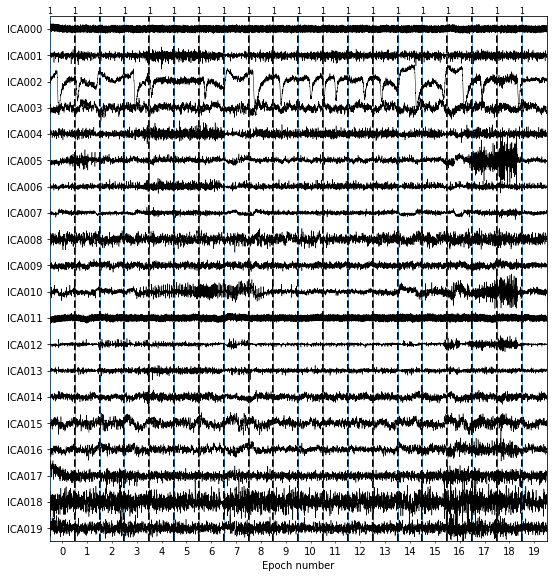

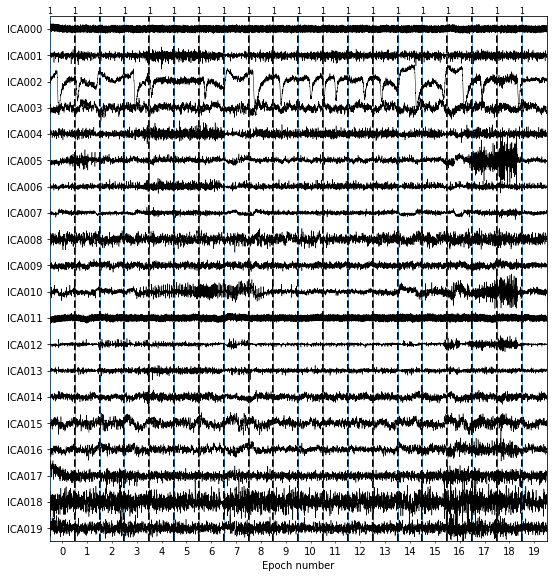

In [ ]:
eeg03_mod_filt_ica.plot_sources(epochs_ica, show_scrollbars=False)

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1855 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1855 matching events found
No baseline correction applied
0 projection items activated


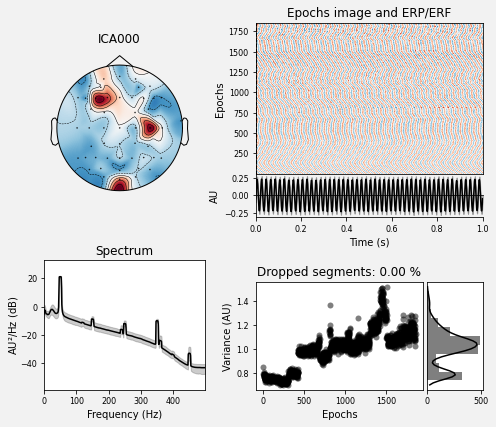

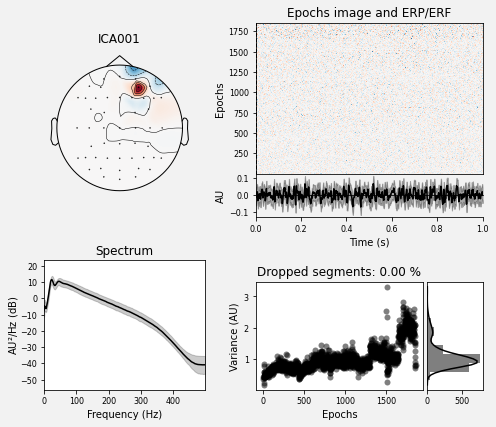

[<Figure size 504x432 with 6 Axes>, <Figure size 504x432 with 6 Axes>]

In [ ]:
eeg03_mod_filt_ica.plot_properties(epochs_ica, picks=[0, 1])

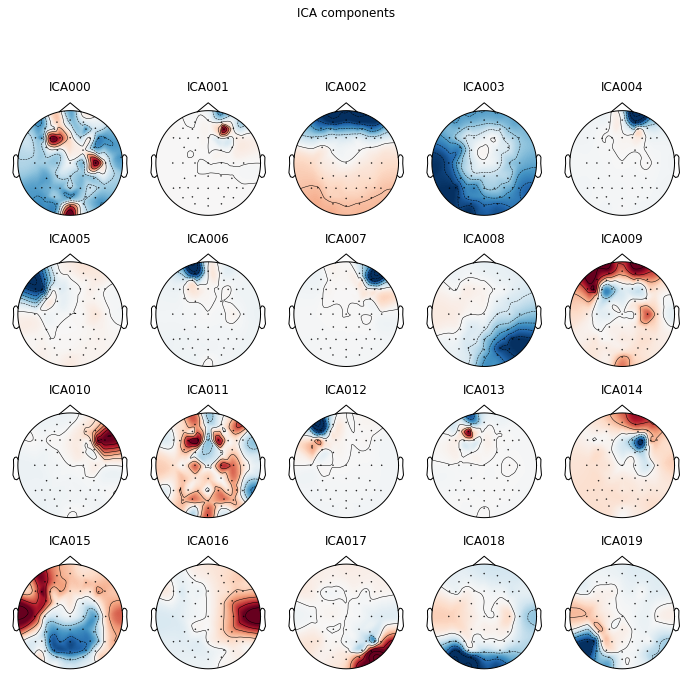

[<MNEFigure size 702x696.24 with 20 Axes>]

In [ ]:
eeg03_mod_filt_ica.plot_components()

Effective window size : 0.256 (s)


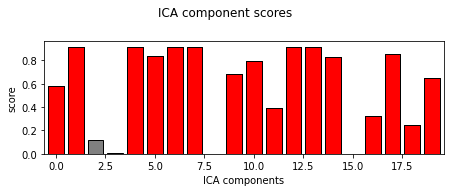

Automatically found muscle artifact ICA components: [0, 1, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19]


In [ ]:
# muscle artifacts
muscle_idx_auto, scores = eeg03_mod_filt_ica.find_bads_muscle(eeg03_mod_filt)
eeg03_mod_filt_ica.plot_scores(scores, exclude=muscle_idx_auto)
print(f'Automatically found muscle artifact ICA components: {muscle_idx_auto}')

Using EOG channel: IO
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


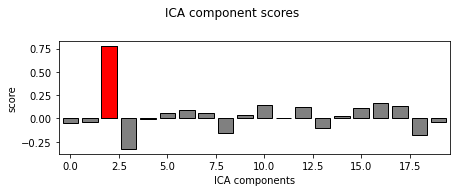

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
928 matching events found
No baseline correction applied
0 projection items activated


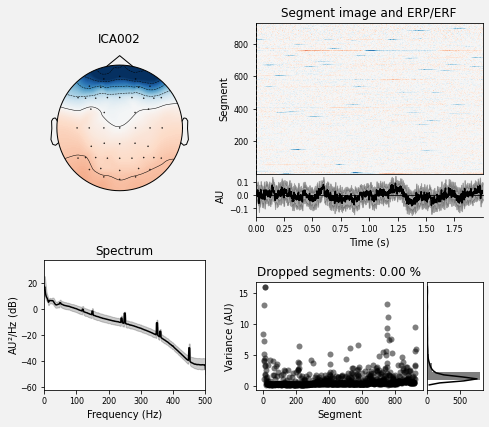

Creating RawArray with float64 data, n_channels=21, n_times=1856000
    Range : 0 ... 1855999 =      0.000 ...  1855.999 secs
Ready.


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # array has the wrong kind or shape, raise the error during one-at-a-time


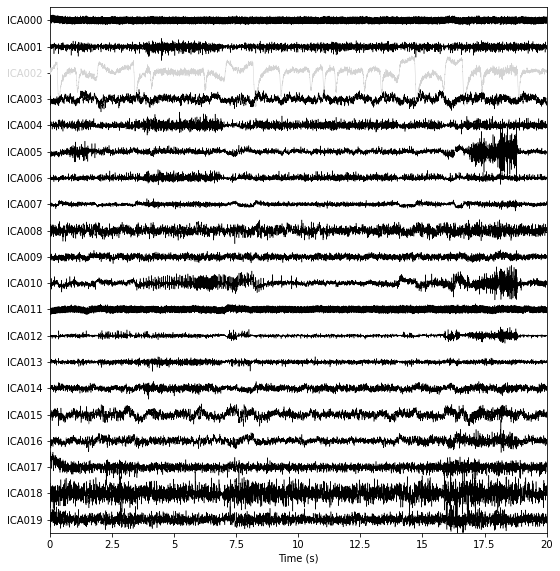

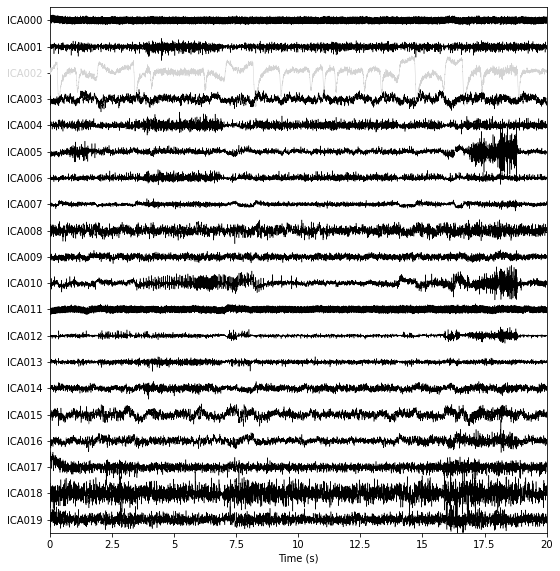

In [ ]:
# eog artifacts
eeg03_mod_filt_ica.exclude = []
# find which ICs match the EOG pattern
eog_indices, eog_scores = eeg03_mod_filt_ica.find_bads_eog(eeg03_mod_filt)
eeg03_mod_filt_ica.exclude = eog_indices

# barplot of ICA component "EOG match" scores
eeg03_mod_filt_ica.plot_scores(eog_scores)

# plot diagnostics
eeg03_mod_filt_ica.plot_properties(eeg03_mod_filt, picks=eog_indices)

# plot ICs applied to raw data, with EOG matches highlighted
eeg03_mod_filt_ica.plot_sources(eeg03_mod_filt, show_scrollbars=False)

... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.5s remaining:    0.0s


... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 10000 samples (10.000 sec)



[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished


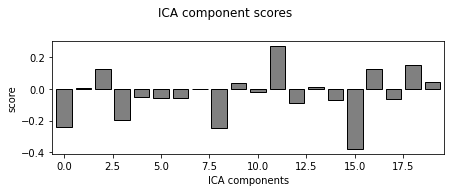

ValueError: ignored

In [ ]:
# ecg artifacts
eeg03_mod_filt_ica.exclude = []
# find which ICs match the ECG pattern
ecg_indices, ecg_scores = eeg03_mod_filt_ica.find_bads_ecg(eeg03_mod_filt, method='correlation', threshold='auto', ch_name='Cz')
eeg03_mod_filt_ica.exclude = ecg_indices

# barplot of ICA component "ECG match" scores
eeg03_mod_filt_ica.plot_scores(ecg_scores)

# plot diagnostics
eeg03_mod_filt_ica.plot_properties(eeg03_mod_filt, picks=ecg_indices)

# plot ICs applied to raw data, with ECG matches highlighted
eeg03_mod_filt_ica.plot_sources(eeg03_mod_filt, show_scrollbars=False)

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 17 ICA components
    Projecting back using 49 PCA components


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # array has the wrong kind or shape, raise the error during one-at-a-time


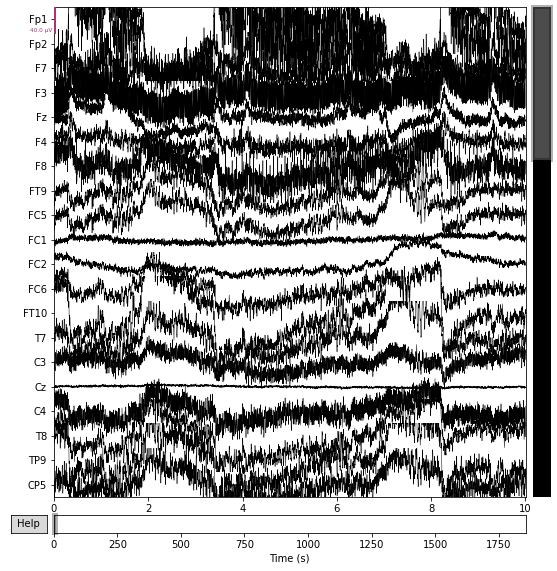

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # array has the wrong kind or shape, raise the error during one-at-a-time


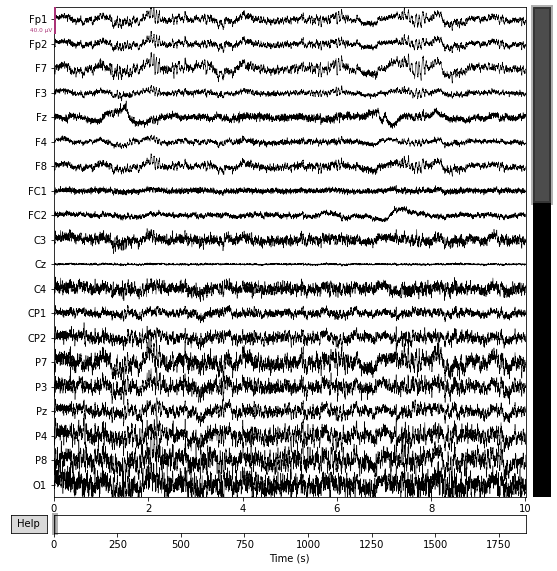

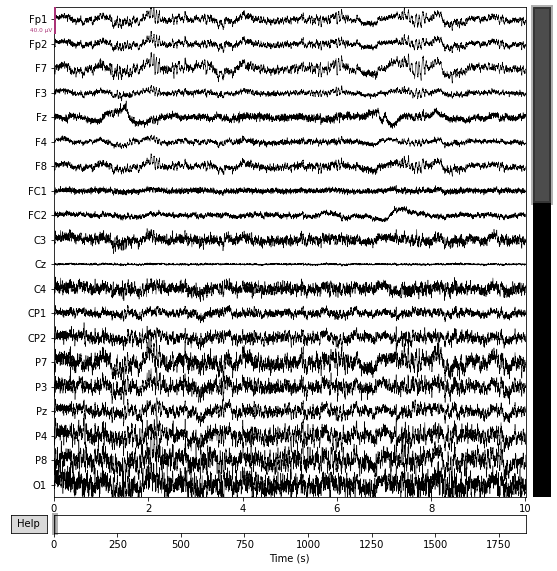

In [ ]:
# removing eog, ecg, and muscle artifacts
eog_ind = eog_indices
ecg_ind = ecg_indices
musc_ind = muscle_idx_auto

eeg03_mod_filt_ica_cl = eeg03_mod_filt_ica.apply(eeg03_mod_filt, exclude = eog_ind + ecg_ind + musc_ind)
eeg03.plot()
eeg03_mod_filt_ica_cl.plot()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


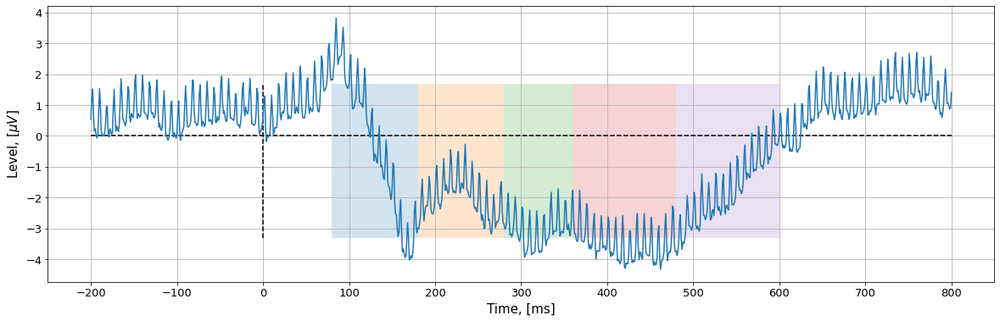

In [ ]:
raw_df_f = eeg03_mod_filt_ica_cl.to_data_frame()
raw_df_f.drop('time', axis = 1, inplace = True)
                                            
# Signal averaging by channels
raw_df_f['level'] = raw_df_f.mean(axis=1)
raw_df_f_mean = raw_df_f['level']
raw_df_f_mean = raw_df_f_mean.to_frame()
raw_df_f_mean['time'] = raw_df_f_mean.index
    


Events03 = EVENTS(igt03)
EEG03 = EEG(raw_df_f_mean, Events03)
EEG03_avg = TOTAL(EEG03)
Plot_EEG03 = EEG_PLOT(EEG03_avg)

# **5.3.2 ICA function** 